In [136]:
library("brms")
library("dplyr")
library("bayesplot")
library("rstanarm")
library("ggplot2")
library("rstan")
library("tidyr")
library("ggpubr")
library("projpred")
library("corrplot")
library("loo")
library("tidyverse")
library("here")
library("knitr")
library("walker")
library("tidybayes")
library("broom")
library("ggridges")
library("reshape2")
library("lubridate")
library("hrbrthemes")
library("viridis")
library('ggthemes')
library(scales)
library(gridExtra)
options(repr.plot.width=10, repr.plot.height=10)

In [61]:
#Guessing the data from the figure
df1=data.frame("roughness" = c(0.05,0.1,1.7,3.1),
              "shearStrength"=c(17.8,15.2,10,9.5),
              "shearStrengthU"=c(17.8+3,15.2+3,10+2,9.5+3),
              "shearStrengthL"=c(17.8-3,15.2-3,10-2,9.5-3),
              "pressure"=c(300,300,300,300)
          )
df2=data.frame("roughness" = c(0.05,0.1,1.7,3.1),
              "shearStrength"=c(12.5,9,8.5,8),
              "shearStrengthU"=c(12.5+1.5,9+2,8.5+1,8+1.5),
              "shearStrengthL"=c(12.5-1.5,9-2,8.5-1,8-1.5),
              "pressure"=c(0,0,0,0)
          )
df = rbind(df1,df2)

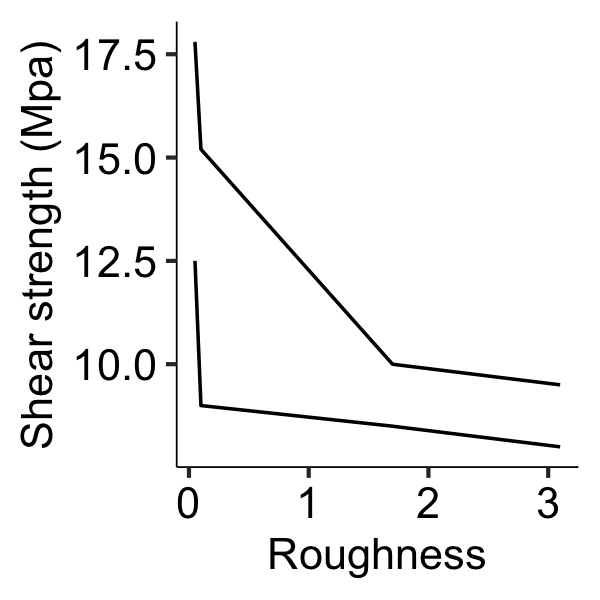

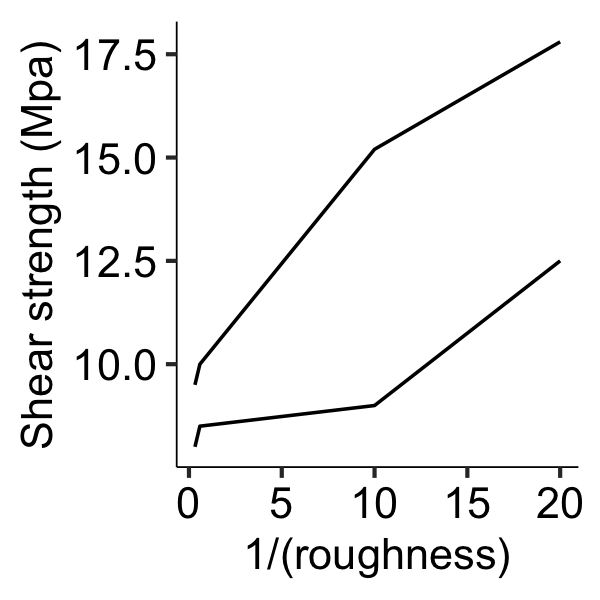

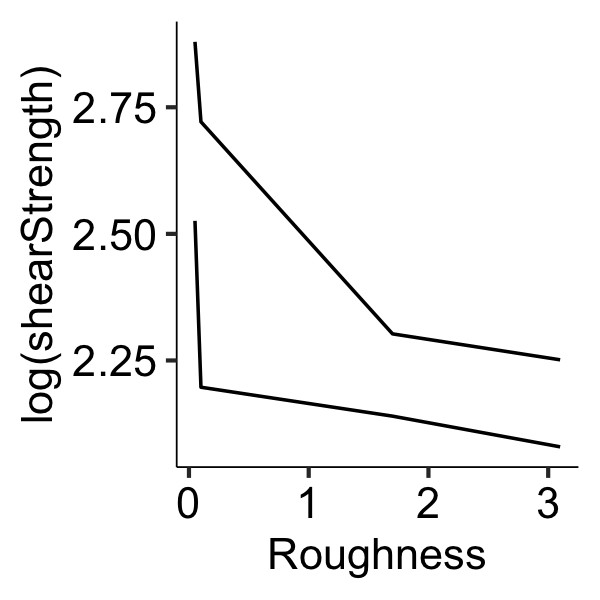

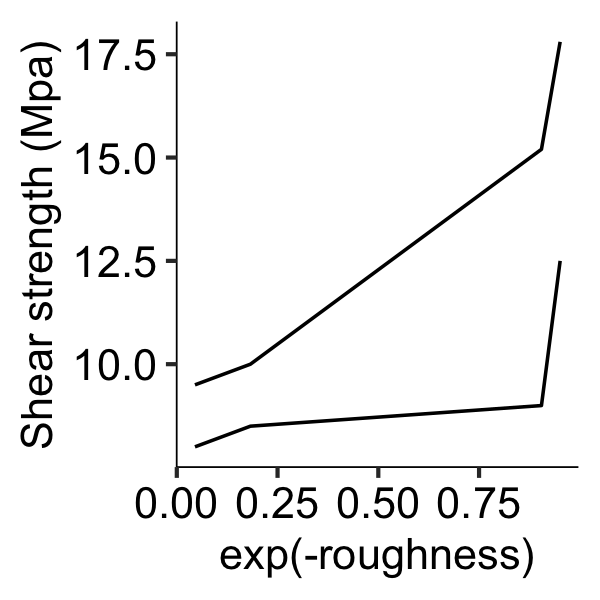

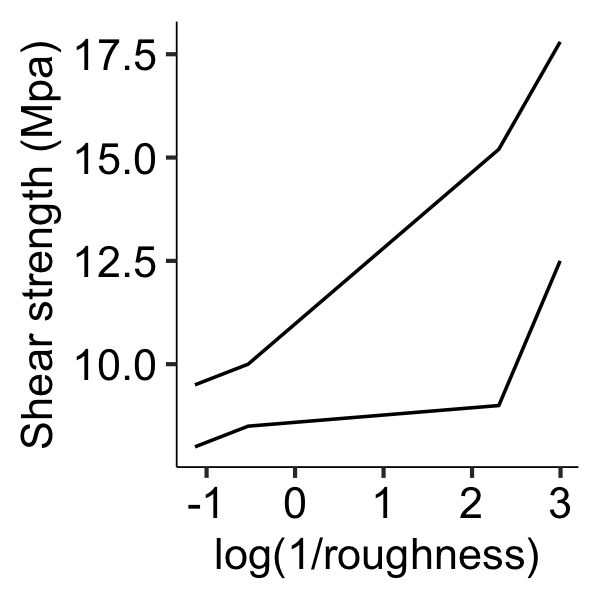

In [186]:
#Plot under different transformations
options(repr.plot.width=5, repr.plot.height=5)
ggplot(data=df) + geom_line(aes(x=(roughness),y=shearStrength,group=pressure),size=1)+
    xlab("Roughness")+ ylab("Shear strength (Mpa)")+
    theme_pubr(26)


ggplot(data=df) + geom_line(aes(x=1/(roughness),y=shearStrength,group=pressure),size=1)+
    xlab("1/(roughness)")+ ylab("Shear strength (Mpa)")+
    theme_pubr(26)

ggplot(data=df) + geom_line(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    xlab("Roughness")+ ylab("log(shearStrength)")+
    theme_pubr(26)


ggplot(data=df) + geom_line(aes(x=exp(-roughness),y=shearStrength,group=pressure),size=1)+
    xlab("exp(-roughness)")+ ylab("Shear strength (Mpa)")+
    theme_pubr(26)

ggplot(data=df) + geom_line(aes(x=(log(1/roughness)),y=shearStrength,group=pressure),size=1)+
    xlab("log(1/roughness)")+ ylab("Shear strength (Mpa)")+
    theme_pubr(26)

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.00,0,Inf,NaN,Inf,Inf,Inf,Inf,Inf,Inf,Inf,Inf,0Pa
2,0.05,0,12.085054,1.370223,9.759463,10.510265,11.203494,11.696066,12.698912,12.983978,13.609641,14.29356,0Pa
3,0.10,0,9.914150,1.118525,8.039025,8.653247,9.171983,9.551232,10.400684,10.668973,11.222808,11.70717,0Pa
4,0.15,0,9.183006,1.107049,7.311667,7.852159,8.478412,8.869770,9.725131,9.928129,10.455472,10.95933,0Pa
5,0.20,0,8.884133,1.124953,6.953910,7.581277,8.144268,8.526857,9.369723,9.623881,10.192194,10.70972,0Pa
6,0.25,0,8.623529,1.137608,6.767015,7.335455,7.889436,8.261909,9.128694,9.351828,9.939817,10.46360,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
96,4.75,0,7.781175,1.212799,5.788836,6.393730,6.976032,7.456263,8.325352,8.585735,9.117385,9.748297,0Pa
97,4.80,0,7.813186,1.239804,5.662888,6.381606,7.027316,7.454733,8.375649,8.635560,9.177575,9.772229,0Pa
98,4.85,0,7.821224,1.244379,5.798760,6.435635,7.008487,7.430167,8.395299,8.622844,9.212193,9.835992,0Pa
99,4.90,0,7.785178,1.226484,5.784460,6.384869,6.967908,7.412624,8.318591,8.629456,9.190431,9.805668,0Pa
100,4.95,0,7.787995,1.189592,5.772987,6.454362,7.016530,7.458809,8.357346,8.586597,9.172019,9.657437,0Pa
101,5.00,0,7.762273,1.245327,5.765266,6.345487,6.967679,7.373965,8.334310,8.586564,9.173711,9.787530,0Pa


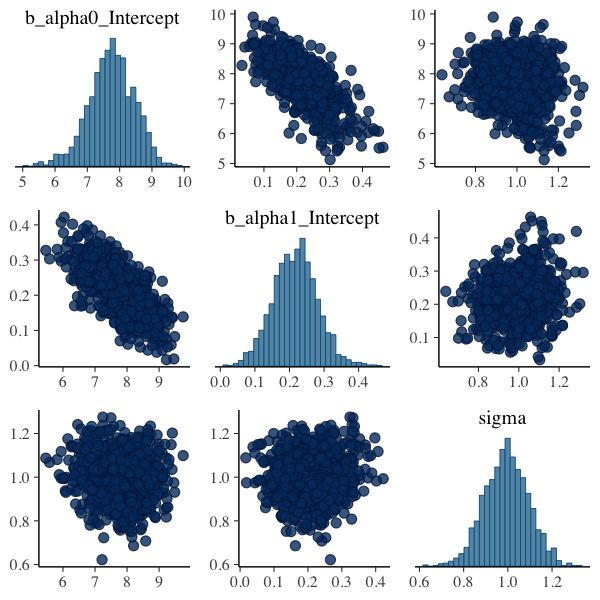

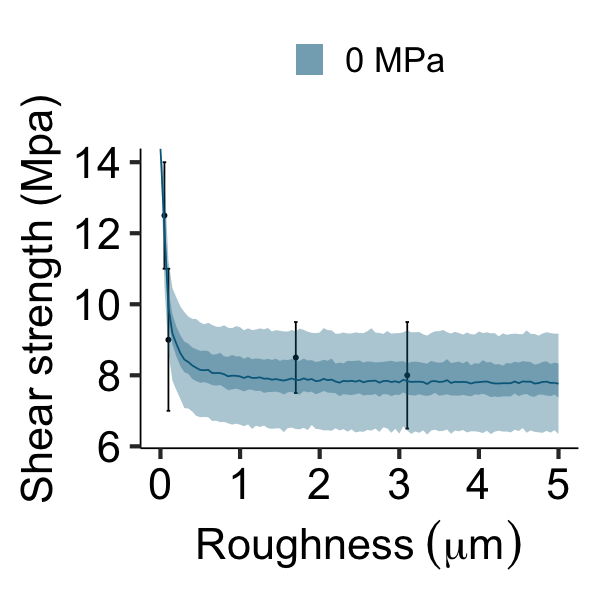

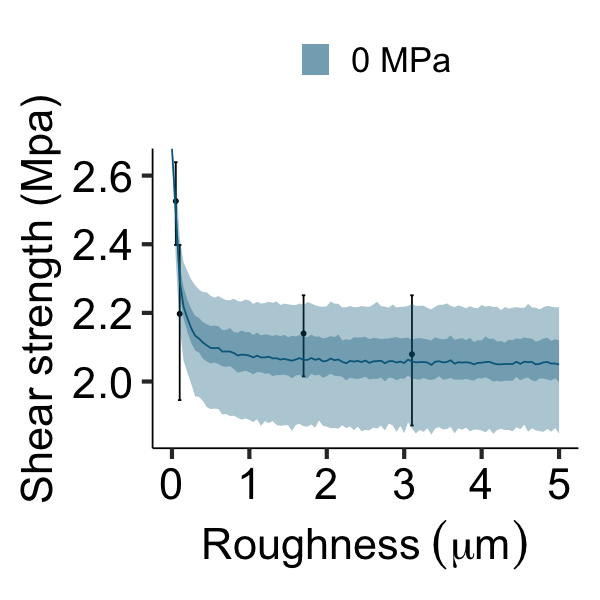

In [187]:
#Fit at just one pressure (0K)
#Model: shearStrength ~ alpha0 + alpha1 / roughness

df = rbind(df2)
prior1 <- 
        prior(normal(5, 3), nlpar = "alpha0",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0d") +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(1, 1), nlpar = "alpha1",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
#           prior(normal(1, 1), nlpar = "alpha2",lb=0) +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + alpha1 / roughness,
        alpha0 + alpha1 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)

pred_df1 = data.frame(roughness=seq(0.00,5,0.05),pressure=rep(0,length(seq(0.00,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.00,5,0.05),pressure=rep(300,length(seq(0.00,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1)

head(preds)
tail(preds)


ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
    geom_ribbon(data = preds, aes(x = roughness, ymin = Q37.5, ymax = Q67.5, fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
    geom_ribbon(data = preds, aes(x = roughness, ymin = Q12.5, ymax = Q87.5, fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))



ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
    geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q37.5), ymax = log(Q67.5), fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
    geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q12.5), ymax = log(Q87.5), fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.00,0,Inf,NaN,Inf,Inf,Inf,Inf,Inf,Inf,Inf,Inf,0Pa
2,0.05,0,11.683901,1.298918,9.617748,10.217902,10.794099,11.268034,12.256994,12.53504,13.12034,13.86502,0Pa
3,0.10,0,10.468715,1.149185,8.558984,9.164301,9.730721,10.150024,10.972147,11.20573,11.80362,12.36151,0Pa
4,0.15,0,9.904335,1.140119,8.018884,8.644352,9.172819,9.535334,10.405648,10.67892,11.17703,11.72956,0Pa
5,0.20,0,9.598600,1.134140,7.757564,8.336500,8.853730,9.221198,10.085407,10.32433,10.87917,11.46526,0Pa
6,0.25,0,9.358982,1.139372,7.513875,8.028411,8.625498,9.008993,9.892824,10.12916,10.62868,11.21380,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
96,4.75,0,7.920771,1.256212,5.899810,6.499697,7.075862,7.499004,8.471973,8.776980,9.367151,9.990506,0Pa
97,4.80,0,7.899279,1.224413,5.951171,6.529689,7.060985,7.519213,8.466785,8.712454,9.300657,9.935121,0Pa
98,4.85,0,7.905974,1.235197,5.927315,6.542020,7.094355,7.484639,8.427003,8.705053,9.338192,10.041000,0Pa
99,4.90,0,7.863885,1.216760,5.917014,6.446463,7.056037,7.479191,8.383132,8.684003,9.267579,9.772105,0Pa
100,4.95,0,7.843321,1.263016,5.730306,6.413792,6.960485,7.462368,8.413377,8.668519,9.247915,9.875488,0Pa
101,5.00,0,7.858034,1.222319,5.849230,6.479288,7.019514,7.459170,8.420710,8.677907,9.245654,9.819767,0Pa


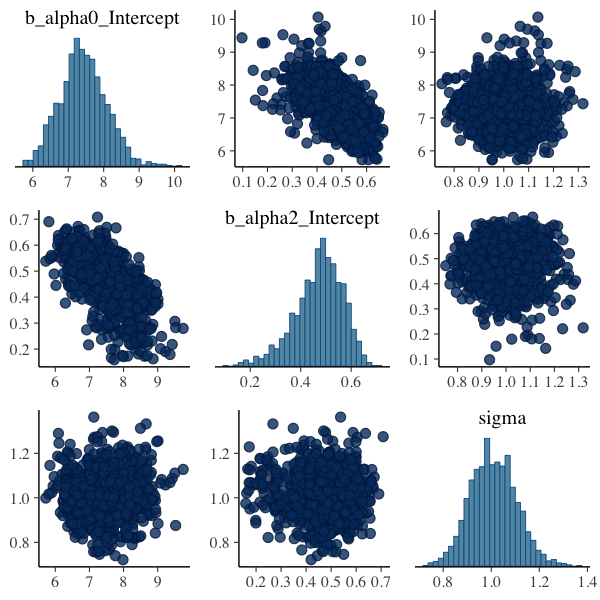

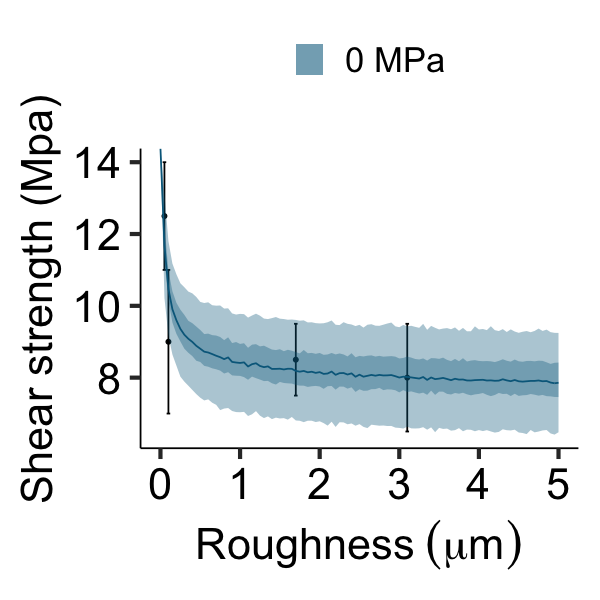

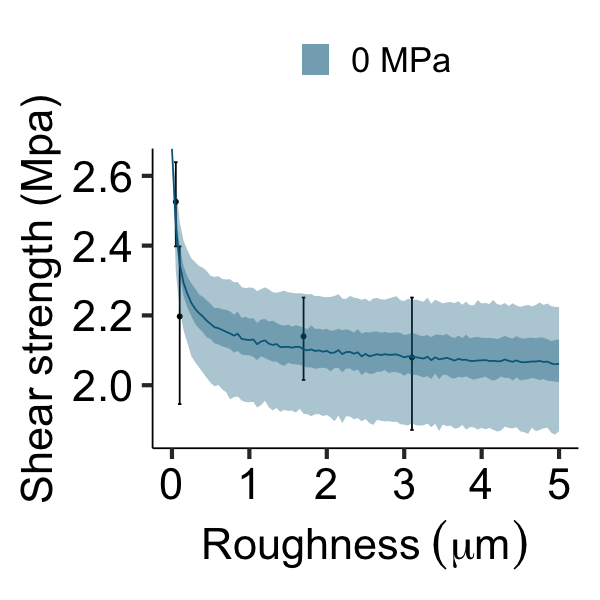

In [188]:
#Model : shearStrength ~ alpha0 + 1 / pow(roughness,alpha2)

df = rbind(df2)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0d") +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
#           prior(normal(1, 1), nlpar = "alpha1",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
          prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + 1 / pow(roughness,alpha2),
        alpha0 + alpha2 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)

pred_df1 = data.frame(roughness=seq(0.00,5,0.05),pressure=rep(0,length(seq(0.00,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.00,5,0.05),pressure=rep(300,length(seq(0.00,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1)

head(preds)
tail(preds)


ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
    geom_ribbon(data = preds, aes(x = roughness, ymin = Q37.5, ymax = Q67.5, fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
    geom_ribbon(data = preds, aes(x = roughness, ymin = Q12.5, ymax = Q87.5, fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
    geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q37.5), ymax = log(Q67.5), fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
    geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q12.5), ymax = log(Q87.5), fill = key)) +
#     geom_ribbon(data = preds, aes(x = roughness, ymin = Q5, ymax = Q95, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Fit in pressure and roughness

### Reciprocal in roughness

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,13.227189,1.298247,11.138448,11.710824,12.329733,12.810278,13.793780,14.120261,14.70167,15.37570,0Pa
2,0.10,0,10.954287,1.154451,9.035798,9.666052,10.177337,10.594754,11.484616,11.744687,12.29177,12.85717,0Pa
3,0.15,0,10.036172,1.167360,8.126380,8.695222,9.259460,9.677504,10.555578,10.801951,11.36696,11.95549,0Pa
4,0.20,0,9.472419,1.170547,7.571805,8.165653,8.704474,9.102300,9.972266,10.244361,10.82057,11.43391,0Pa
5,0.25,0,9.098331,1.148634,7.306518,7.786148,8.314859,8.737214,9.578838,9.857209,10.42841,11.00061,0Pa
6,0.30,0,8.827741,1.184813,6.883041,7.454749,8.001645,8.435694,9.374849,9.664712,10.23547,10.73319,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,10.43322,1.197523,8.507424,9.054878,9.633625,10.05661,10.93592,11.22648,11.80650,12.45341,300Pa
196,4.80,300,10.45547,1.212778,8.489214,9.062890,9.630640,10.06527,11.01733,11.27317,11.84940,12.41768,300Pa
197,4.85,300,10.42689,1.233430,8.451221,9.064237,9.585281,10.01166,10.97002,11.24372,11.82251,12.42377,300Pa
198,4.90,300,10.45619,1.203615,8.477328,9.083614,9.653193,10.05632,10.97591,11.26411,11.86512,12.44210,300Pa
199,4.95,300,10.40239,1.242043,8.330536,9.043438,9.556816,10.01792,10.94603,11.23044,11.82599,12.41001,300Pa
200,5.00,300,10.45592,1.223878,8.443177,9.050350,9.635331,10.06977,11.02377,11.29875,11.84167,12.45931,300Pa


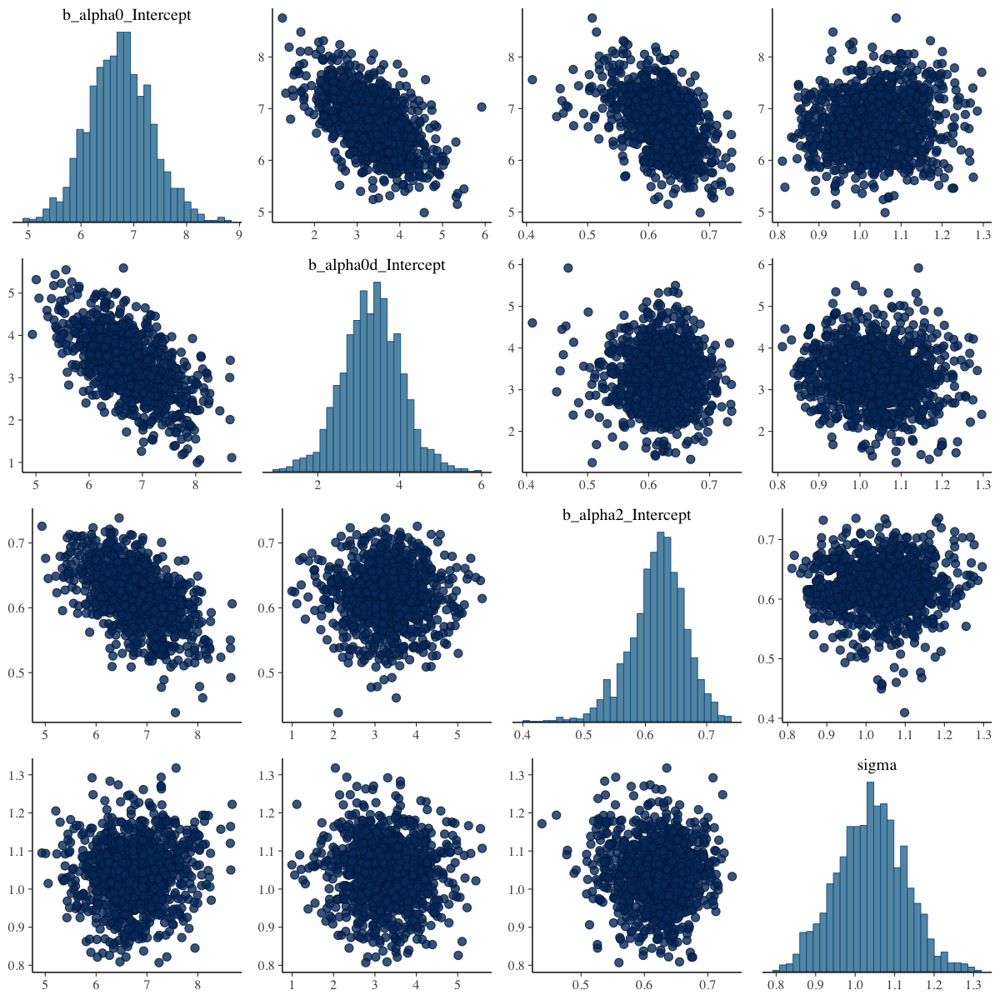

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,24.50587,3.466582,18.94386,22.26538,26.68046,30.51705
2,0.01,4,24.54955,3.460376,19.07158,22.31266,26.58256,30.67399
3,0.01,7,24.57431,3.411753,19.10326,22.23590,26.72438,30.44140
4,0.01,10,24.61413,3.420210,19.25460,22.33979,26.80642,30.43137
5,0.01,13,24.64988,3.440849,19.09296,22.38140,26.83652,30.68156
6,0.01,16,24.65389,3.428468,19.21605,22.37298,26.76999,30.65486


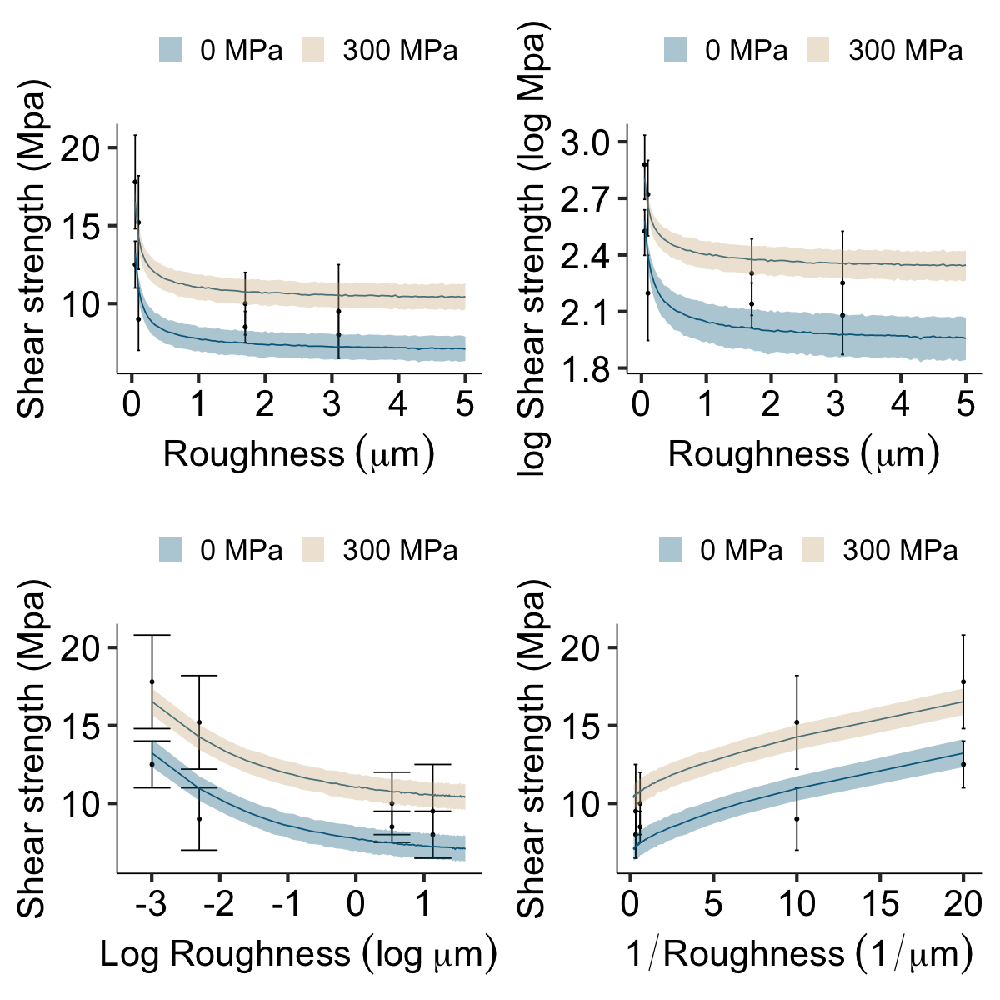

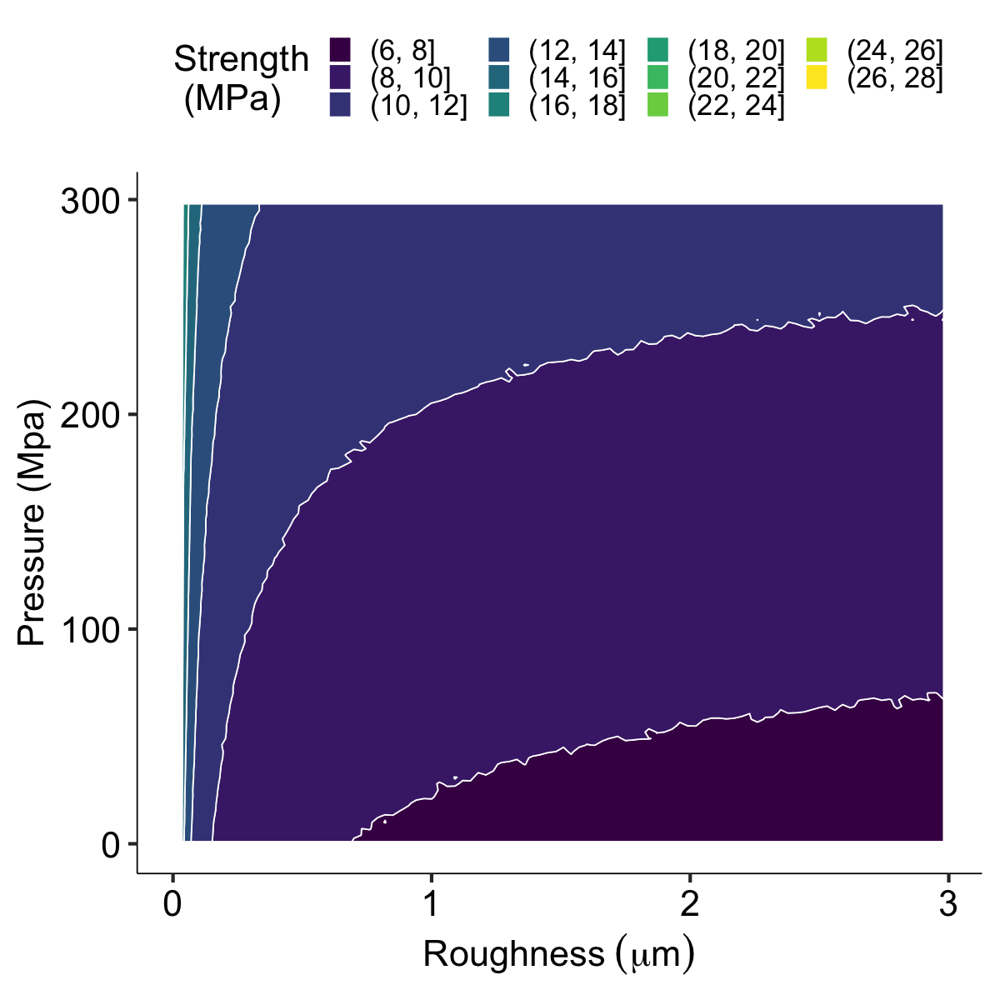

In [166]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + (1 / pow(roughness,alpha2 ))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
#           prior(normal(1, 1), nlpar = "alpha1",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
          prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + (1 / pow(roughness,alpha2 )),
        alpha0 + alpha0d + alpha2 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,12.710008,1.327003,10.571694,11.203215,11.807797,12.301331,13.313163,13.582251,14.19966,14.85885,0Pa
2,0.10,0,10.313384,1.205331,8.377188,8.934793,9.503259,9.940137,10.819888,11.093674,11.69175,12.23423,0Pa
3,0.15,0,9.536308,1.142272,7.645693,8.224425,8.783285,9.205941,10.040529,10.287894,10.84491,11.37305,0Pa
4,0.20,0,9.073619,1.152746,7.176419,7.777663,8.311539,8.702270,9.620770,9.845146,10.36370,10.96969,0Pa
5,0.25,0,8.858389,1.119561,6.991023,7.615900,8.121485,8.490459,9.393351,9.618696,10.13876,10.67208,0Pa
6,0.30,0,8.697032,1.144875,6.771777,7.401831,7.966134,8.349354,9.209899,9.460953,10.00821,10.56464,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,10.22413,1.176489,8.314885,8.915484,9.421697,9.846132,10.75756,11.01851,11.53561,12.20767,300Pa
196,4.80,300,10.27156,1.168390,8.357615,8.967170,9.467099,9.884261,10.80345,11.07734,11.60729,12.20291,300Pa
197,4.85,300,10.29049,1.209605,8.254994,8.932051,9.548382,9.907115,10.80865,11.07613,11.65266,12.27097,300Pa
198,4.90,300,10.24907,1.175713,8.315162,8.903027,9.453868,9.889889,10.77109,11.00267,11.58778,12.18139,300Pa
199,4.95,300,10.26875,1.207286,8.177209,8.883777,9.488445,9.945615,10.80818,11.07841,11.61581,12.22298,300Pa
200,5.00,300,10.25921,1.216516,8.280632,8.842178,9.438245,9.898267,10.79506,11.02865,11.63026,12.32505,300Pa


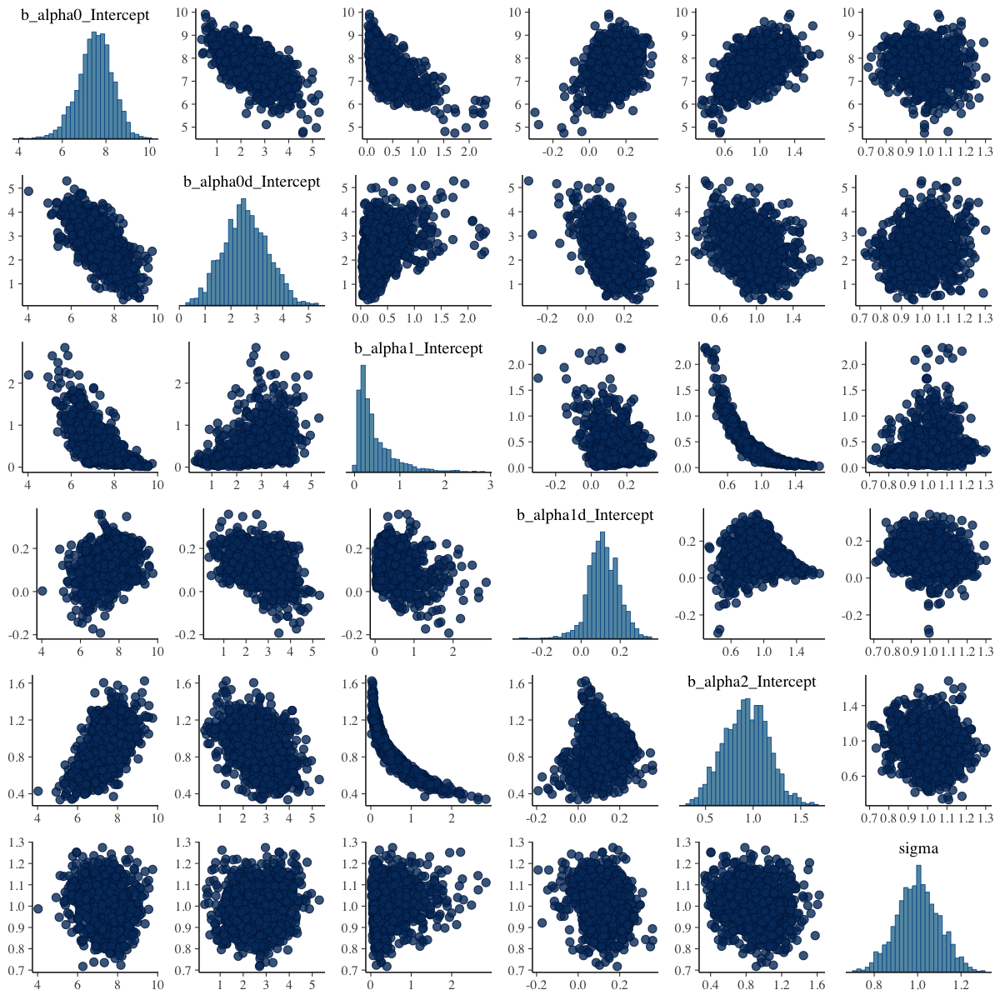

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,31.25719,8.791686,20.29939,25.11914,35.56915,47.64436
2,0.01,4,31.39368,8.837046,20.37089,25.21038,35.81174,47.90657
3,0.01,7,31.52060,8.881436,20.33058,25.31357,35.89948,48.30089
4,0.01,10,31.67830,8.909248,20.40209,25.45487,36.04659,48.67958
5,0.01,13,31.83726,8.993446,20.52504,25.60501,36.49819,48.61158
6,0.01,16,32.03324,9.056785,20.51597,25.76962,36.43678,48.66616


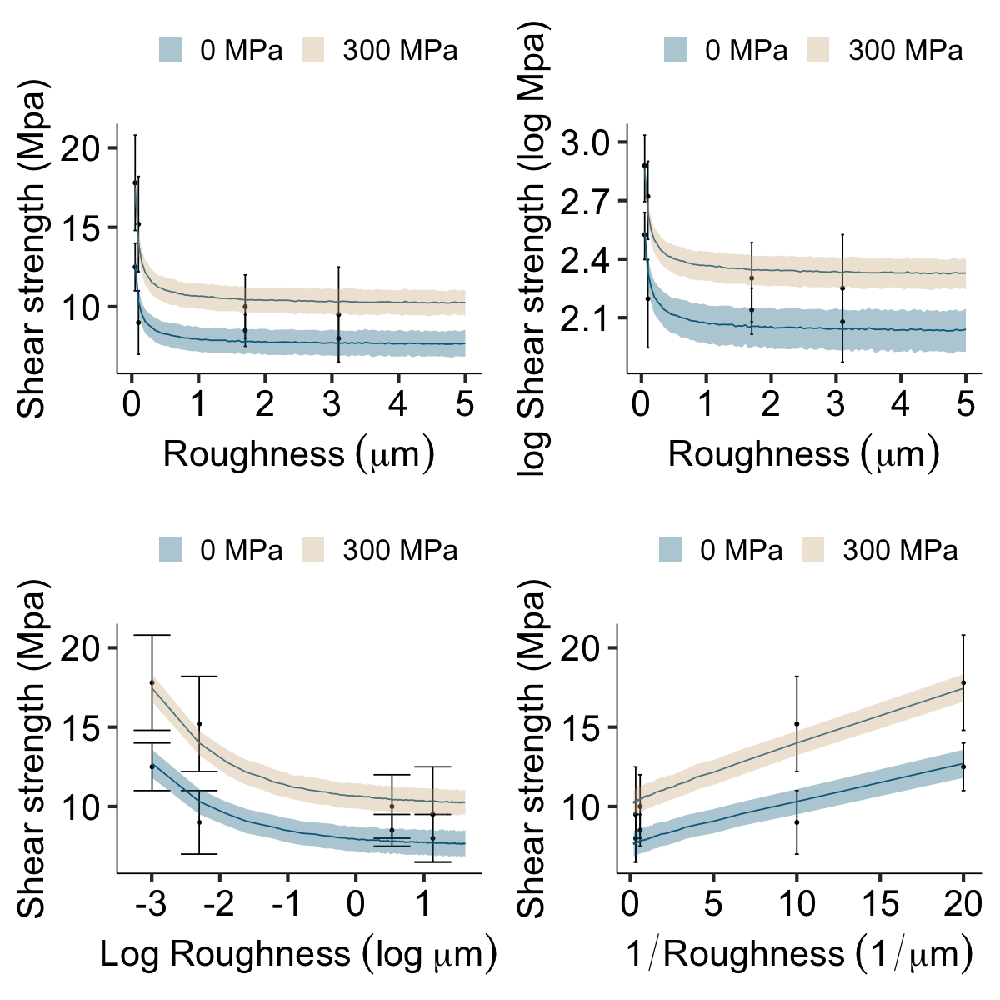

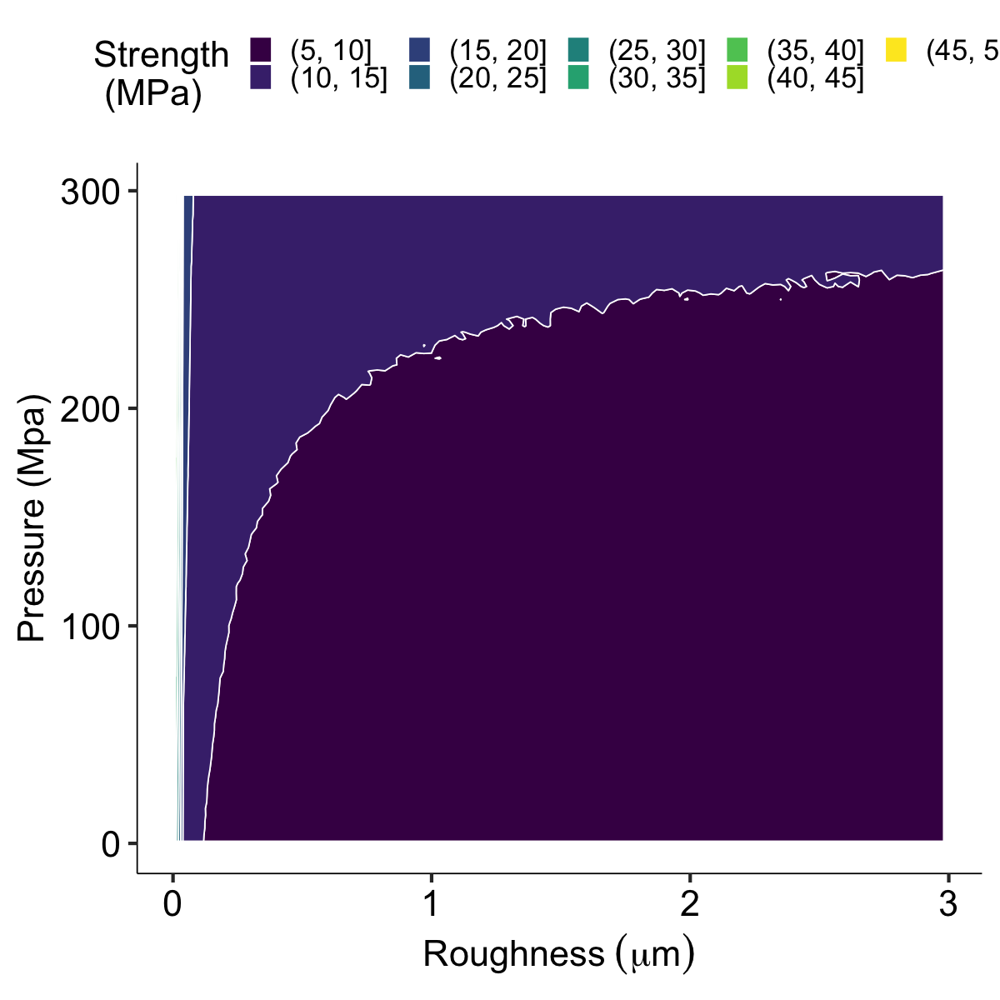

In [169]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + ((alpha1 + alpha1d * pressure/300) / pow(roughness,alpha2 ))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(1, 1), nlpar = "alpha1",lb=0) +
          prior(normal(0, 0.1), nlpar = "alpha1d") +
          prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + ((alpha1 + alpha1d * pressure/300) / pow(roughness,alpha2 )),
        alpha0 + alpha0d + alpha1 + alpha1d + alpha2 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,12.418943,1.245927,10.421572,11.010940,11.567226,12.004207,12.947514,13.216808,13.85402,14.50865,0Pa
2,0.10,0,10.721465,1.134294,8.922203,9.442961,9.971058,10.344922,11.210525,11.454985,11.98345,12.68934,0Pa
3,0.15,0,10.007727,1.140565,8.160589,8.666427,9.233524,9.626979,10.493567,10.777604,11.30505,11.89886,0Pa
4,0.20,0,9.571696,1.138170,7.731897,8.319372,8.828380,9.211346,10.059708,10.312078,10.89604,11.42741,0Pa
5,0.25,0,9.322133,1.126960,7.378774,8.034152,8.624350,9.007098,9.820612,10.061105,10.58029,11.17185,0Pa
6,0.30,0,9.014889,1.160228,7.039060,7.672808,8.266504,8.657995,9.520905,9.808333,10.35802,10.92606,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,9.866514,1.186998,7.915593,8.514044,9.088655,9.478576,10.40185,10.66737,11.22810,11.74433,300Pa
196,4.80,300,9.960915,1.229024,7.941626,8.541547,9.103834,9.572161,10.51288,10.80412,11.40089,11.97927,300Pa
197,4.85,300,9.915763,1.212446,7.979357,8.553328,9.087816,9.481255,10.46767,10.74397,11.27927,11.89885,300Pa
198,4.90,300,9.882331,1.194704,7.964625,8.487438,9.079255,9.469908,10.42844,10.70088,11.27368,11.81143,300Pa
199,4.95,300,9.918369,1.203819,7.986240,8.560032,9.115624,9.533658,10.46268,10.70597,11.30370,11.89112,300Pa
200,5.00,300,9.911420,1.201992,7.860642,8.514009,9.089826,9.536936,10.42671,10.69741,11.30844,11.95131,300Pa


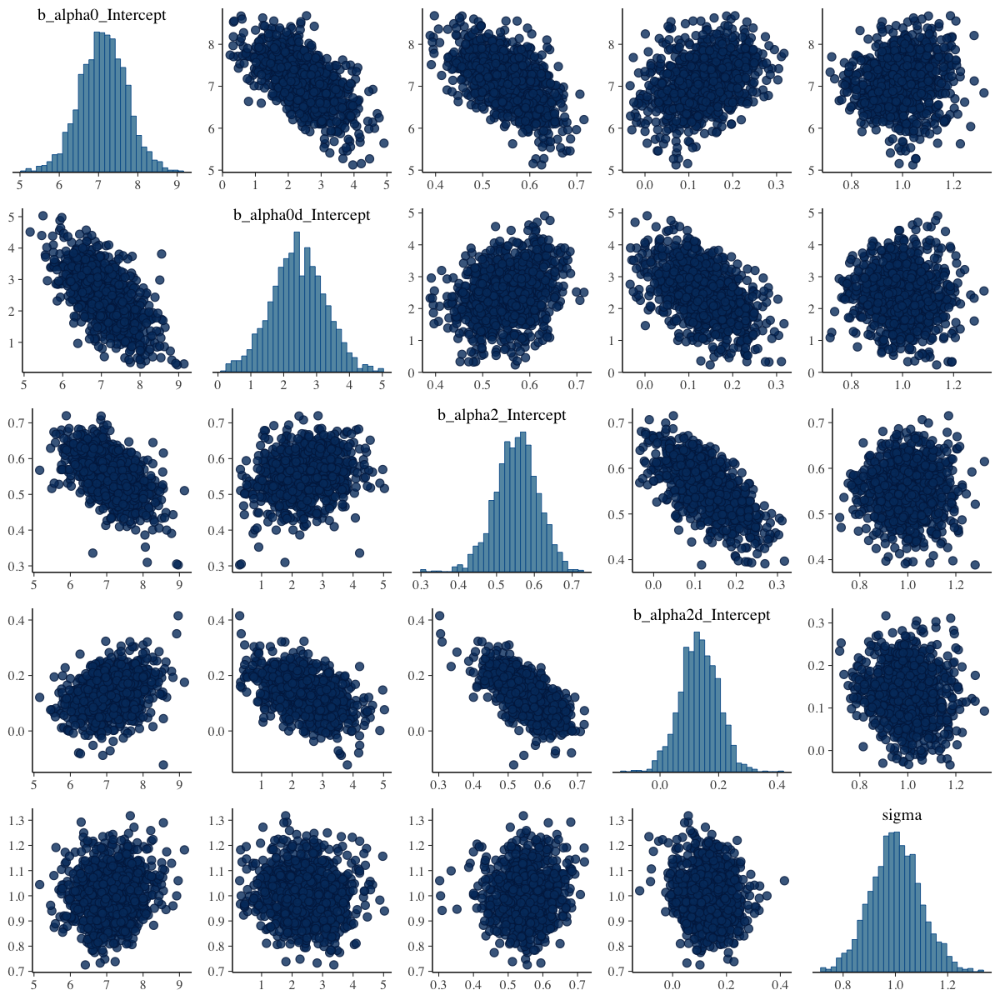

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,20.33204,3.306812,15.41492,18.00865,22.29639,26.34476
2,0.01,4,20.43081,3.337806,15.56951,18.11753,22.41681,26.47890
3,0.01,7,20.53999,3.296393,15.67692,18.16357,22.48202,26.54644
4,0.01,10,20.65002,3.280248,15.68300,18.46337,22.58639,26.81217
5,0.01,13,20.79016,3.280783,15.95961,18.47362,22.78091,26.65507
6,0.01,16,20.86783,3.258304,15.93607,18.59680,22.81551,26.54533


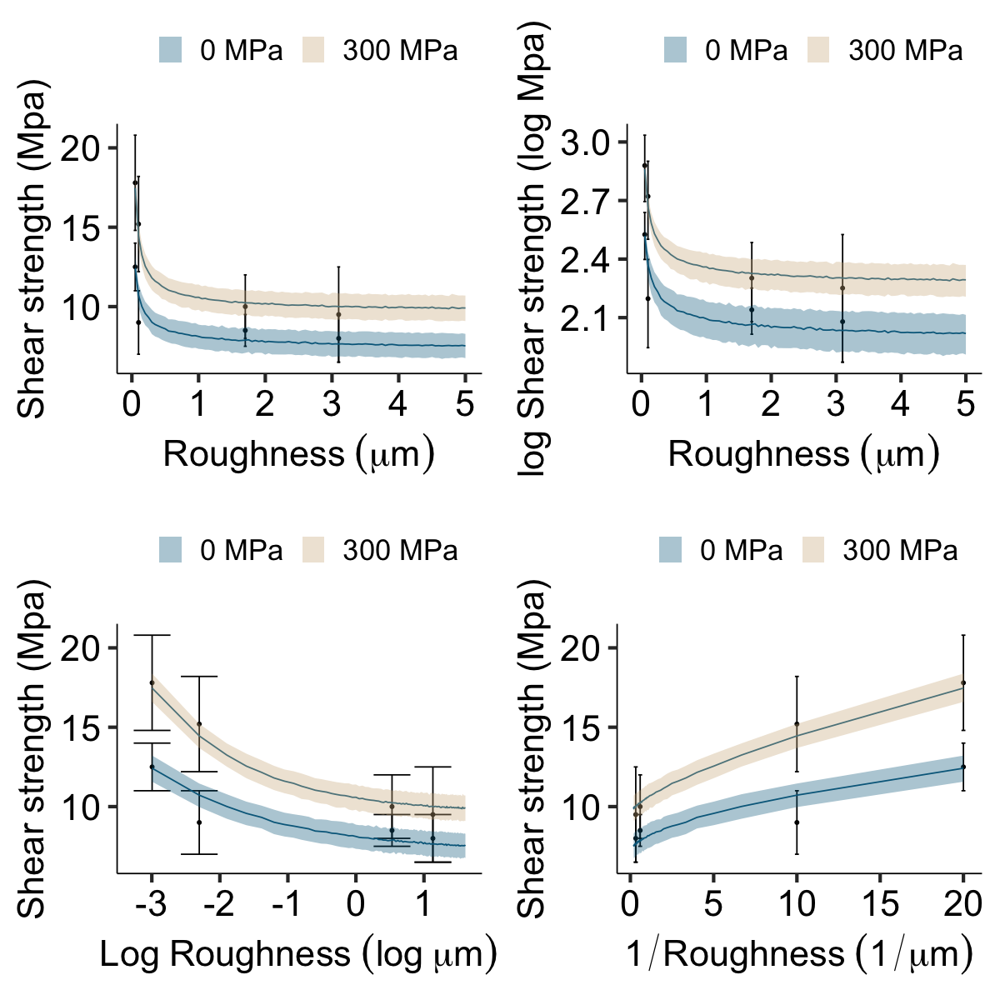

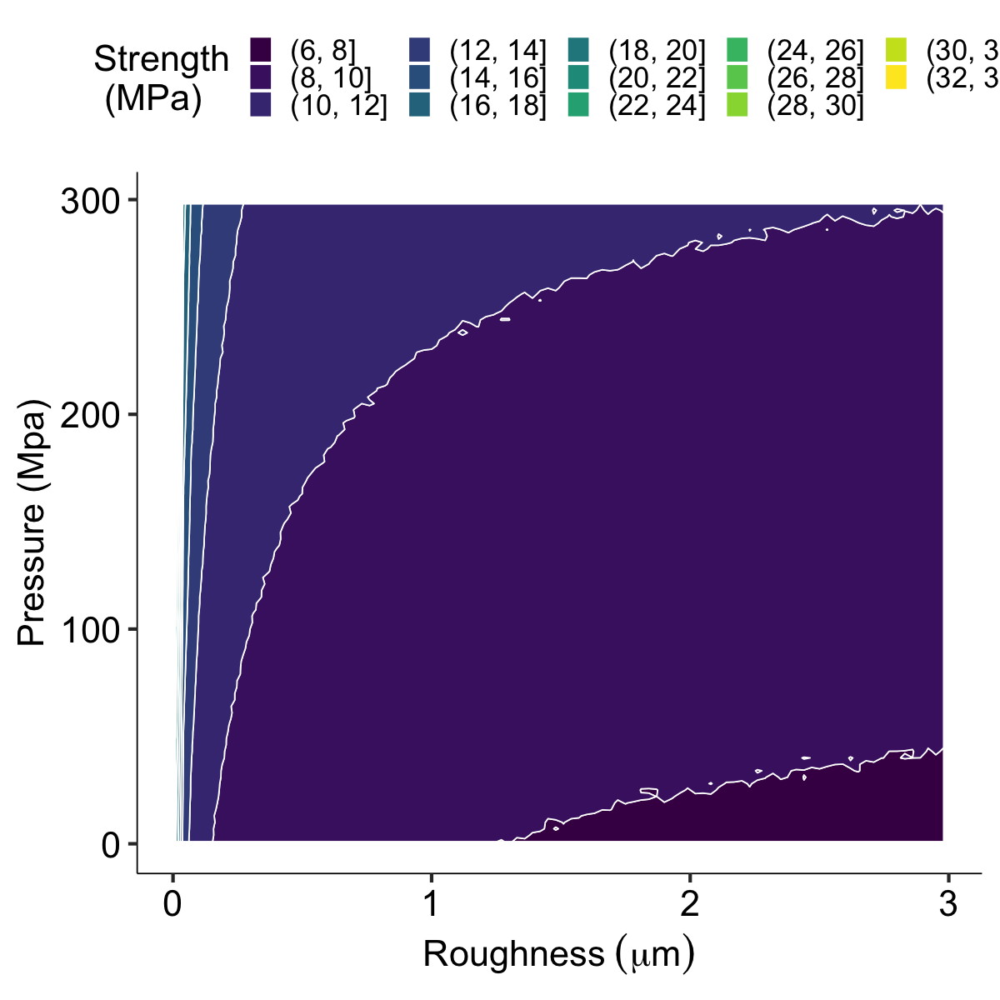

In [157]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + (1 / pow(roughness,alpha2+(alpha2d*pressure/300) ))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
#           prior(normal(1, 1), nlpar = "alpha1",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
          prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
          prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + (1 / pow(roughness,alpha2+(alpha2d*pressure/300) )),
        alpha0 + alpha0d + alpha2 + alpha2d ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 


## Exponential in roughness

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,11.22188,1.316235,9.075454,9.734865,10.32222,10.79377,11.83283,12.11694,12.73347,13.35116,0Pa
2,0.10,0,11.09109,1.298417,9.036099,9.607273,10.19219,10.63271,11.69782,11.96458,12.57822,13.22608,0Pa
3,0.15,0,10.98841,1.301419,8.820302,9.484438,10.10910,10.58462,11.60013,11.86563,12.43035,13.11108,0Pa
4,0.20,0,10.91047,1.317171,8.695519,9.387921,10.07042,10.49117,11.51732,11.78477,12.40609,13.05646,0Pa
5,0.25,0,10.73621,1.271781,8.677367,9.282535,9.86538,10.30390,11.30273,11.55505,12.21308,12.85659,0Pa
6,0.30,0,10.62626,1.320833,8.506047,9.109926,9.70337,10.18993,11.20918,11.50742,12.15793,12.83580,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,11.33249,1.331896,9.081619,9.803631,10.44914,10.93712,11.97533,12.25596,12.89192,13.45104,300Pa
196,4.80,300,11.30156,1.309169,9.149044,9.829393,10.41076,10.85860,11.93458,12.18410,12.80604,13.44115,300Pa
197,4.85,300,11.31847,1.284812,9.095429,9.842054,10.47087,10.92306,11.93158,12.20704,12.78029,13.35868,300Pa
198,4.90,300,11.28770,1.305750,9.039453,9.732348,10.42437,10.92424,11.87840,12.16432,12.75689,13.39281,300Pa
199,4.95,300,11.27302,1.318003,9.152010,9.784449,10.37939,10.83299,11.86300,12.15155,12.79622,13.46904,300Pa
200,5.00,300,11.26662,1.329659,9.156330,9.726083,10.34291,10.83151,11.85823,12.13961,12.81172,13.44836,300Pa


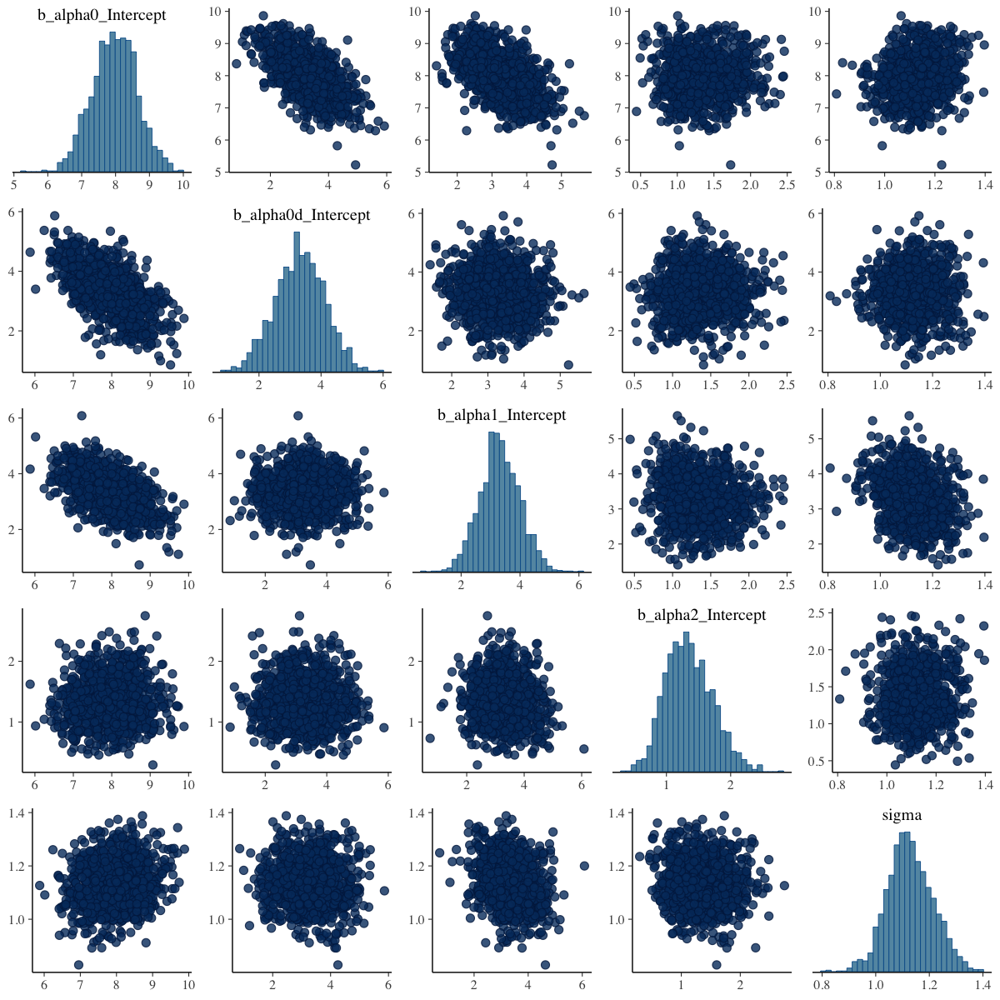

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,11.31111,1.302330,9.235253,10.40416,12.19753,13.50353
2,0.01,4,11.35567,1.297774,9.268871,10.50449,12.18315,13.49511
3,0.01,7,11.31912,1.310625,9.156224,10.42481,12.22087,13.46367
4,0.01,10,11.38036,1.312733,9.128116,10.50520,12.24503,13.54792
5,0.01,13,11.38951,1.268193,9.337778,10.53734,12.24624,13.52160
6,0.01,16,11.43506,1.285961,9.341066,10.58909,12.32169,13.43457


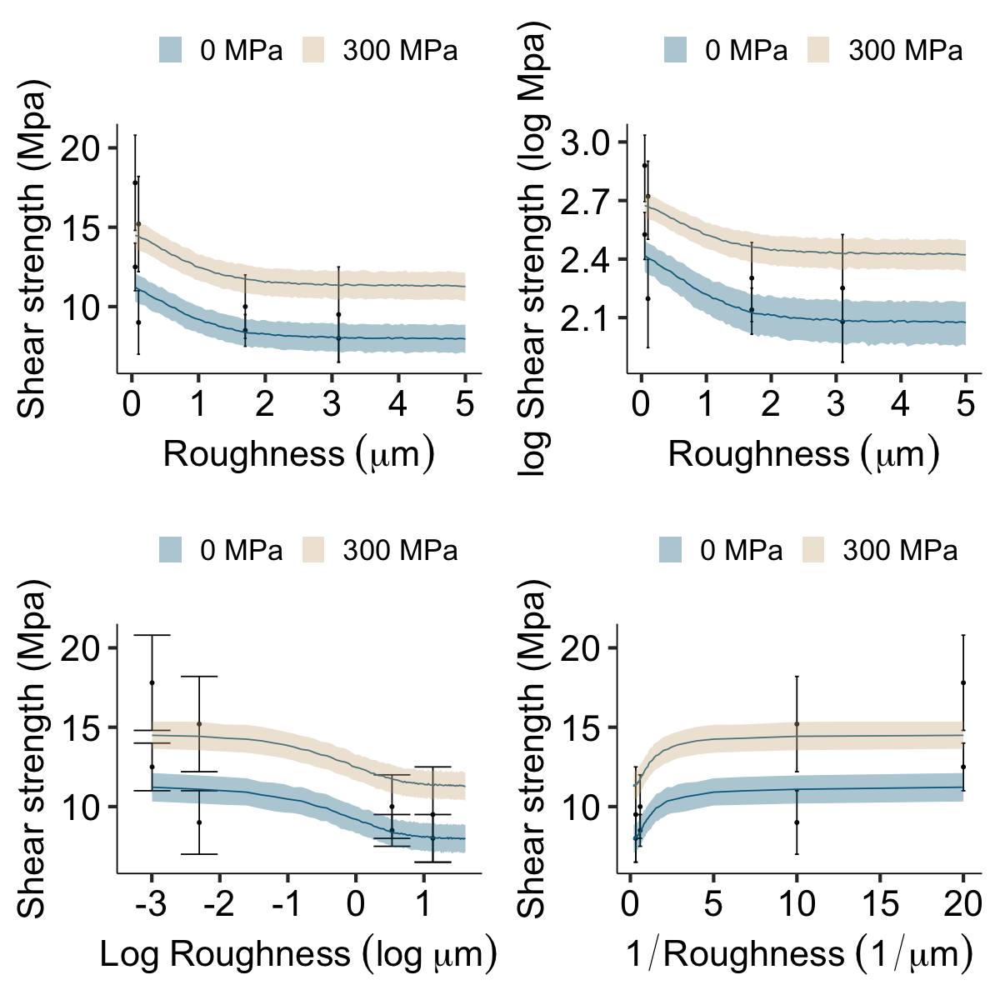

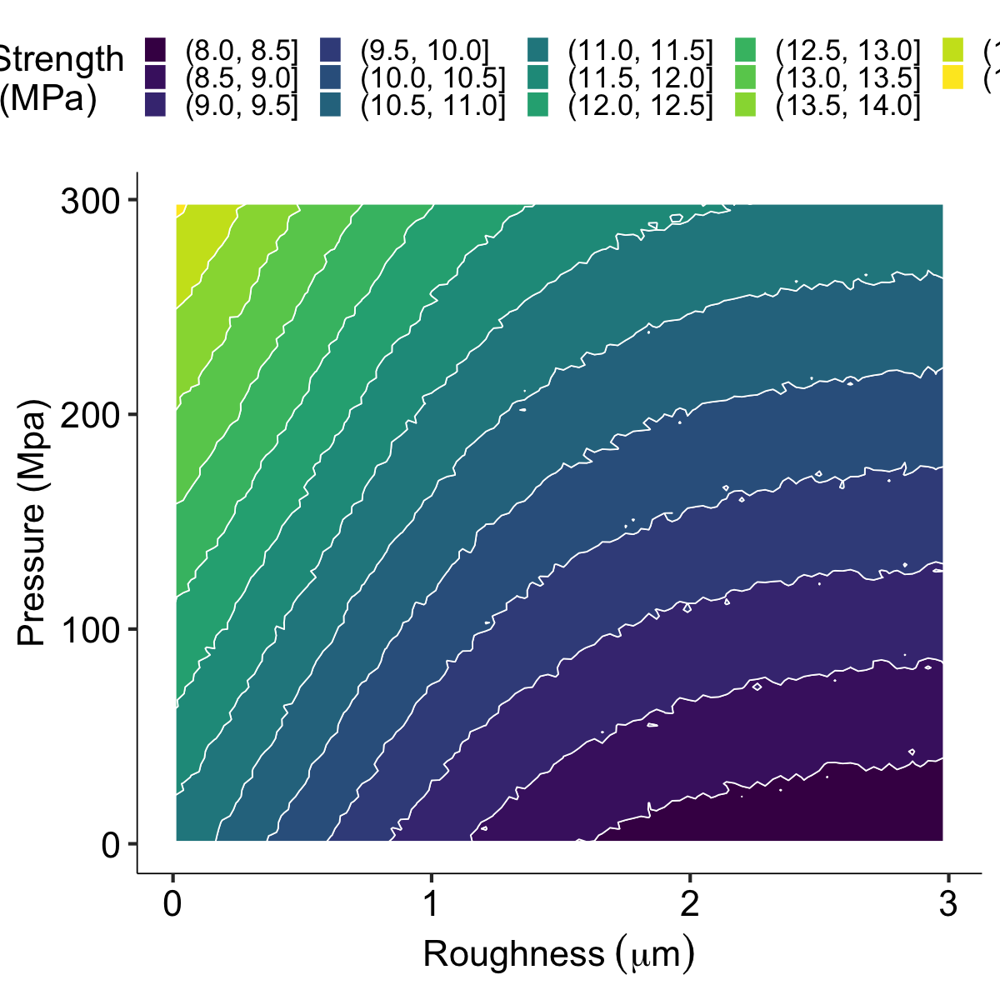

In [161]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * exp(-pow(roughness,alpha2))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(1, 1), nlpar = "alpha1",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
          prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * exp(-pow(roughness,alpha2)),
        alpha0 + alpha0d + alpha1 + alpha2 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(1,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,10.95050,1.235842,8.859533,9.528984,10.116062,10.58849,11.52819,11.78957,12.36410,12.93006,0Pa
2,0.10,0,10.85718,1.233885,8.845022,9.431850,10.049413,10.49506,11.40609,11.70332,12.31457,12.84895,0Pa
3,0.15,0,10.82648,1.237115,8.819386,9.448873,10.015617,10.45491,11.38809,11.63382,12.23673,12.89863,0Pa
4,0.20,0,10.73884,1.215731,8.778373,9.347114,9.930299,10.36805,11.29221,11.52693,12.15530,12.75985,0Pa
5,0.25,0,10.63409,1.247053,8.663945,9.223900,9.813488,10.21847,11.21885,11.47185,12.06375,12.65773,0Pa
6,0.30,0,10.60445,1.214271,8.595564,9.254671,9.833533,10.23908,11.12698,11.41083,12.00054,12.61066,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,10.57092,1.273980,8.541599,9.146045,9.680384,10.11637,11.14235,11.43328,12.07608,12.68777,300Pa
196,4.80,300,10.59275,1.302597,8.490539,9.106504,9.746834,10.19267,11.16950,11.46216,12.06932,12.68433,300Pa
197,4.85,300,10.61048,1.275575,8.521630,9.156951,9.789451,10.22779,11.16681,11.44645,12.02840,12.76245,300Pa
198,4.90,300,10.60943,1.258838,8.517720,9.135795,9.767839,10.20046,11.16154,11.44415,12.10205,12.68342,300Pa
199,4.95,300,10.57375,1.316128,8.398802,9.100258,9.698982,10.13775,11.14889,11.44374,12.07647,12.76685,300Pa
200,5.00,300,10.53525,1.287610,8.406183,9.072771,9.698355,10.16816,11.09637,11.37792,12.00994,12.59727,300Pa


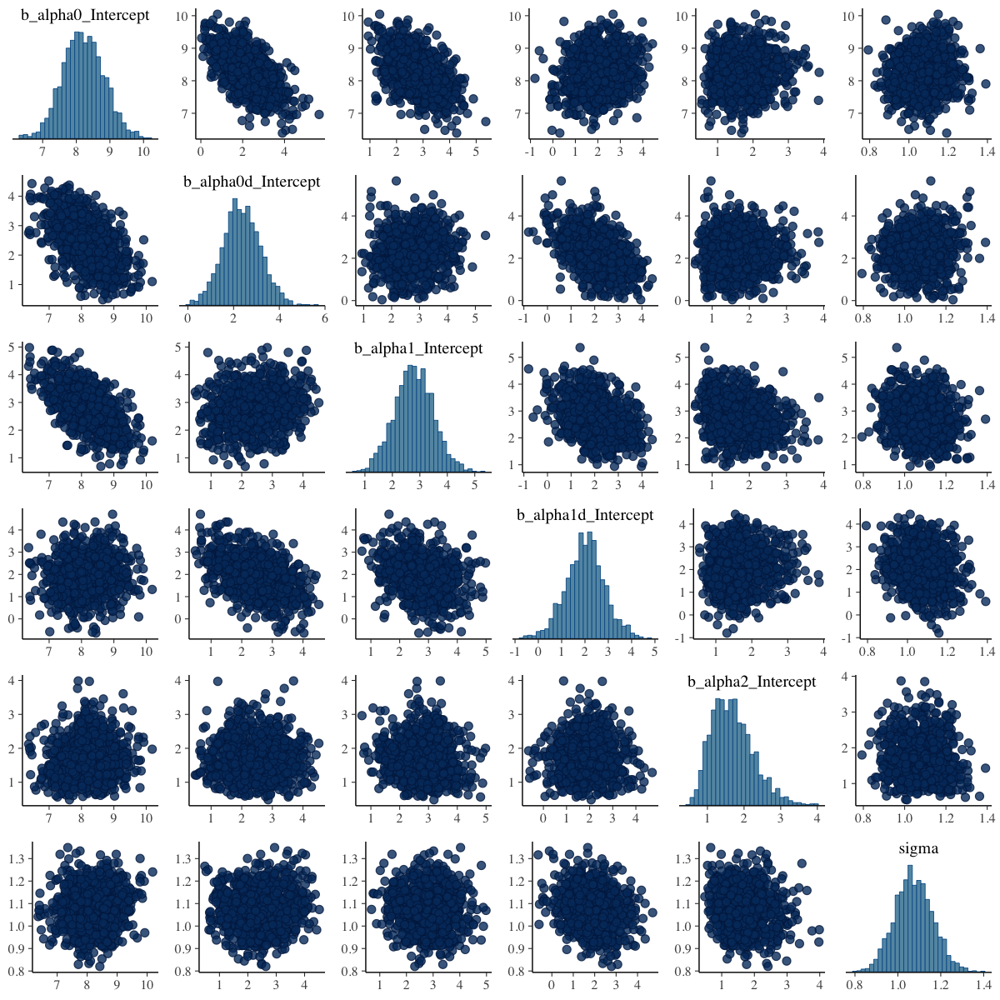

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,11.00517,1.197798,8.999278,10.24288,11.82405,12.95289
2,0.01,4,11.06846,1.228532,9.007338,10.25898,11.89093,13.07020
3,0.01,7,11.11262,1.230044,9.110623,10.29988,11.94148,13.07619
4,0.01,10,11.09391,1.263960,8.980430,10.26824,11.91715,13.20623
5,0.01,13,11.15893,1.254886,9.139751,10.32168,11.97153,13.23437
6,0.01,16,11.20458,1.219998,9.179933,10.36968,12.00167,13.16491


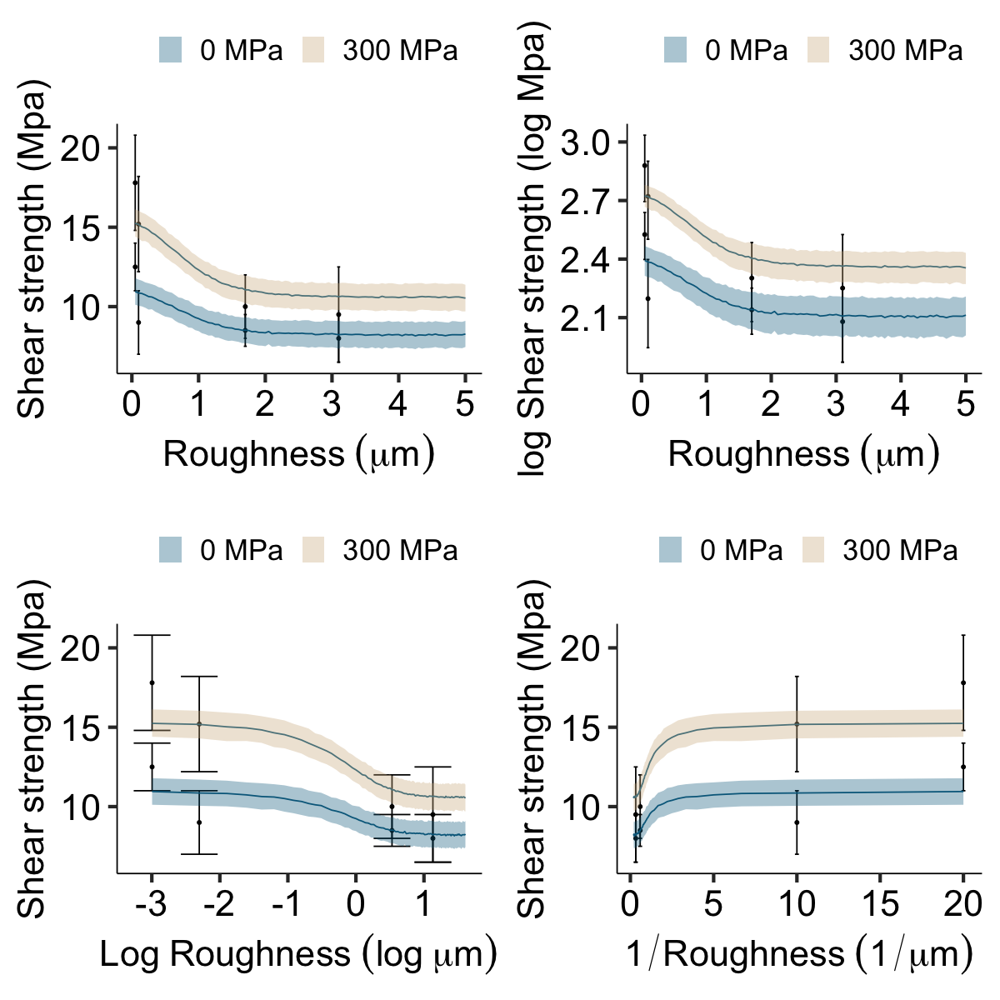

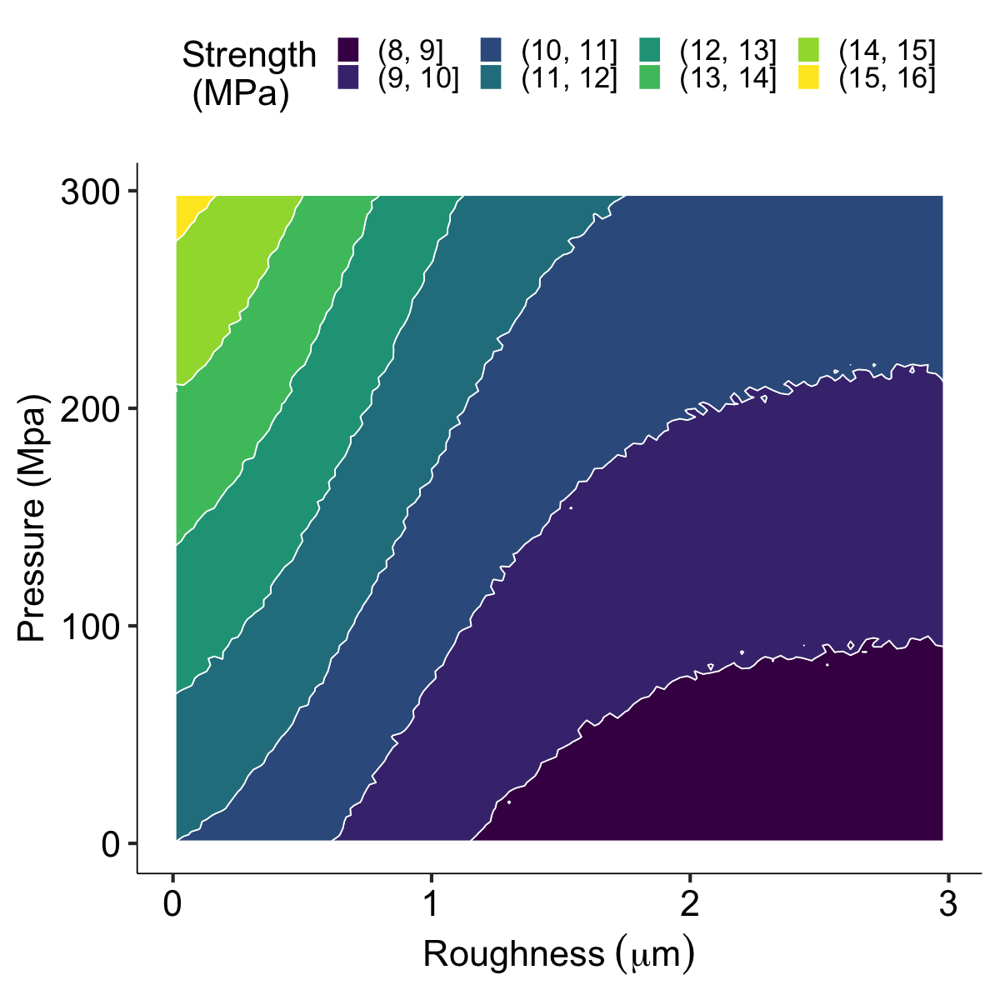

In [170]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * exp(-pow(roughness,alpha2))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(1, 1), nlpar = "alpha1",lb=0) +
          prior(normal(0, 1), nlpar = "alpha1d") +
          prior(normal(0.5, 1), nlpar = "alpha2",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + (alpha1 + alpha1d*pressure/300) * exp(-pow(roughness,alpha2)),
        alpha0 + alpha0d + alpha1 + alpha1d + alpha2 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(1,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,11.20223,1.292349,9.090320,9.722020,10.353689,10.78220,11.80204,12.03949,12.68520,13.29922,0Pa
2,0.10,0,11.14935,1.294051,8.993033,9.666951,10.307075,10.73539,11.71904,11.97950,12.58955,13.33579,0Pa
3,0.15,0,10.97378,1.293790,8.847937,9.510236,10.131847,10.56776,11.55350,11.79250,12.45497,13.05764,0Pa
4,0.20,0,10.88264,1.318189,8.703326,9.383687,10.014167,10.47644,11.46461,11.74288,12.34089,13.00923,0Pa
5,0.25,0,10.76263,1.318718,8.612802,9.234999,9.859858,10.35889,11.36865,11.64247,12.28580,12.94560,0Pa
6,0.30,0,10.63042,1.342313,8.366785,9.077237,9.779992,10.22686,11.26125,11.52749,12.18134,12.77573,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,11.29475,1.320650,9.064897,9.758665,10.41692,10.89355,11.96042,12.20516,12.75871,13.39873,300Pa
196,4.80,300,11.29317,1.328413,9.073236,9.815282,10.43603,10.86913,11.90481,12.15407,12.77196,13.41661,300Pa
197,4.85,300,11.29643,1.315699,9.125433,9.741897,10.44693,10.89067,11.88907,12.19487,12.78288,13.43990,300Pa
198,4.90,300,11.26205,1.340281,9.082649,9.753913,10.33274,10.82485,11.86233,12.17182,12.76376,13.47983,300Pa
199,4.95,300,11.28067,1.330897,9.084416,9.655221,10.32982,10.88253,11.89735,12.20198,12.76652,13.47250,300Pa
200,5.00,300,11.31497,1.313099,9.214715,9.809466,10.37460,10.89953,11.93618,12.20823,12.83392,13.50050,300Pa


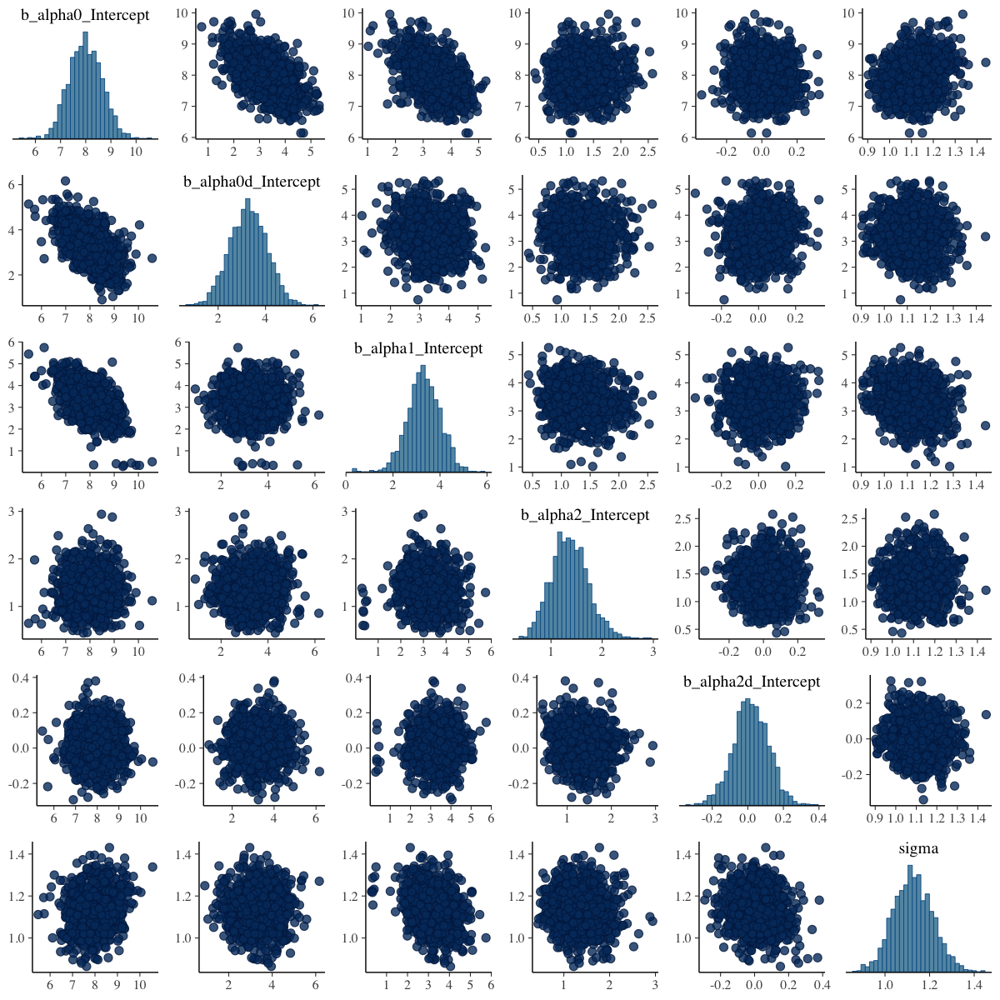

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,11.28290,1.273271,9.184473,10.42276,12.17025,13.31804
2,0.01,4,11.29832,1.303699,9.129002,10.39941,12.21073,13.41389
3,0.01,7,11.38700,1.262088,9.252271,10.56804,12.23833,13.44511
4,0.01,10,11.36746,1.314224,9.259905,10.51904,12.26443,13.51264
5,0.01,13,11.41041,1.283274,9.289758,10.56503,12.25611,13.53354
6,0.01,16,11.49602,1.257664,9.429666,10.66414,12.31297,13.49355


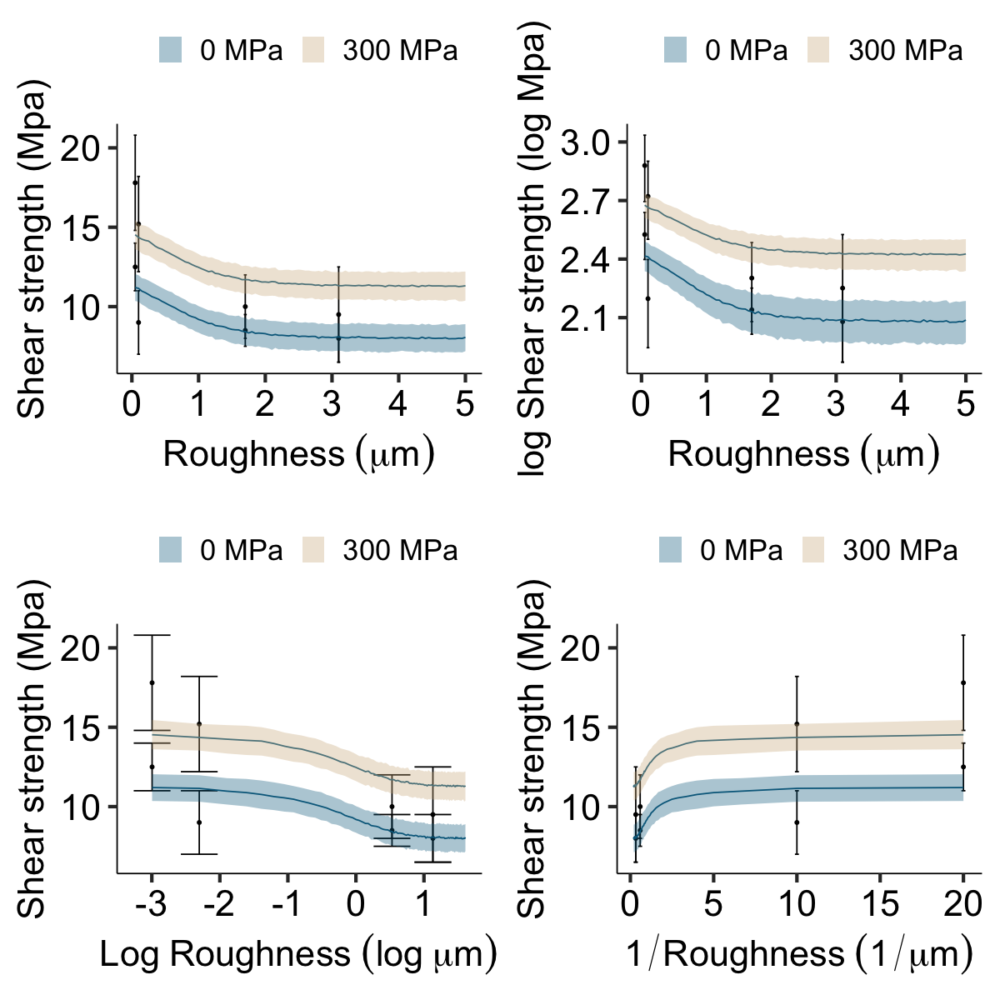

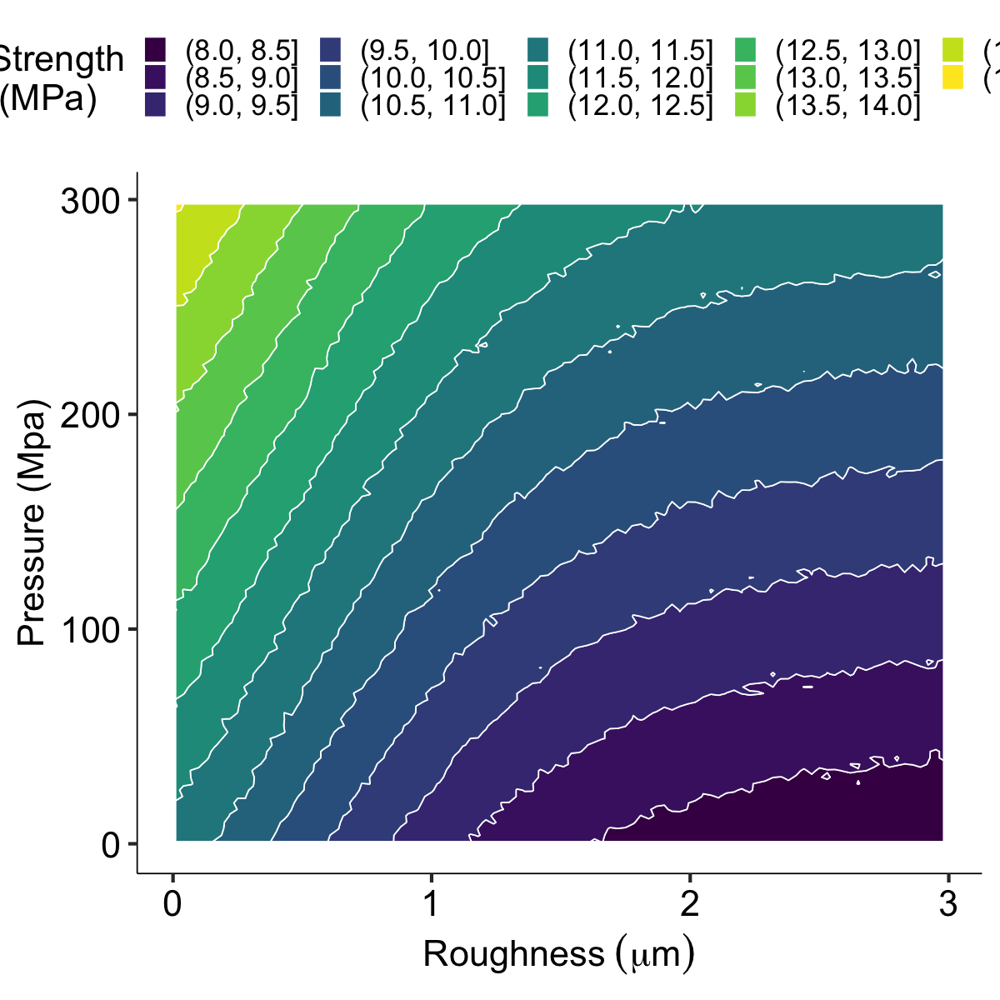

In [165]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * exp(-pow(roughness,alpha2+alpha2d*pressure/300))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(1, 1), nlpar = "alpha1",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
          prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
          prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * exp(-pow(roughness,alpha2+alpha2d*pressure/300)),
        alpha0 + alpha0d + alpha1 + alpha2 + alpha2d ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(1,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

## Log

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,12.40489,1.276750,10.275946,10.926381,11.553600,11.999354,12.98820,13.27731,13.86608,14.48855,0Pa
2,0.10,0,11.46010,1.227755,9.500995,10.066736,10.622312,11.057640,12.04695,12.29234,12.84791,13.44435,0Pa
3,0.15,0,10.91865,1.244177,8.918552,9.500185,10.059130,10.494952,11.45993,11.72293,12.35464,13.05091,0Pa
4,0.20,0,10.55527,1.196704,8.588681,9.123048,9.704239,10.187391,11.12223,11.37903,11.90475,12.49310,0Pa
5,0.25,0,10.30374,1.179561,8.429588,8.972877,9.521490,9.912713,10.79716,11.09841,11.65480,12.27542,0Pa
6,0.30,0,10.04705,1.242686,7.982761,8.638193,9.191673,9.649798,10.63733,10.93101,11.51643,12.00047,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,9.799211,1.280729,7.675961,8.365626,8.945931,9.416711,10.34138,10.61365,11.24635,11.93039,300Pa
196,4.80,300,9.784208,1.334758,7.563289,8.246663,8.888735,9.359768,10.37625,10.68767,11.29236,12.02534,300Pa
197,4.85,300,9.734117,1.324421,7.502505,8.174794,8.882339,9.348666,10.34416,10.67182,11.25987,11.90161,300Pa
198,4.90,300,9.810902,1.336652,7.672940,8.279425,8.901757,9.371045,10.41193,10.69689,11.33449,12.04023,300Pa
199,4.95,300,9.750404,1.326688,7.609606,8.224406,8.821213,9.343340,10.32254,10.64200,11.27540,11.93627,300Pa
200,5.00,300,9.763849,1.356345,7.552110,8.186604,8.819521,9.387292,10.39743,10.70015,11.29641,11.95600,300Pa


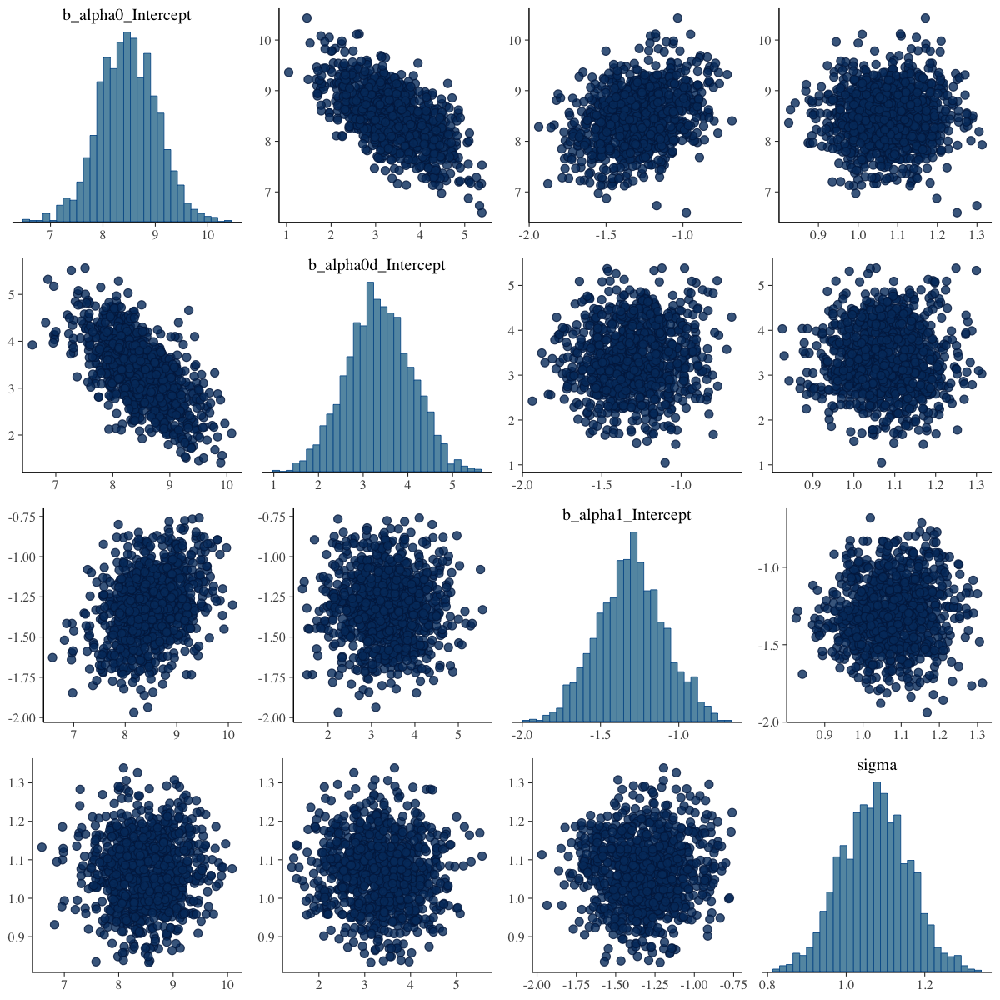

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,14.52905,1.426971,12.14186,13.56781,15.47145,16.88462
2,0.01,4,14.54876,1.447512,12.12256,13.59216,15.51401,16.93000
3,0.01,7,14.58201,1.424132,12.22691,13.61239,15.54986,16.96023
4,0.01,10,14.59560,1.436253,12.17401,13.64509,15.57228,16.95033
5,0.01,13,14.60087,1.438564,12.24167,13.61753,15.59838,16.95991
6,0.01,16,14.71166,1.412387,12.36858,13.75506,15.65665,17.01298


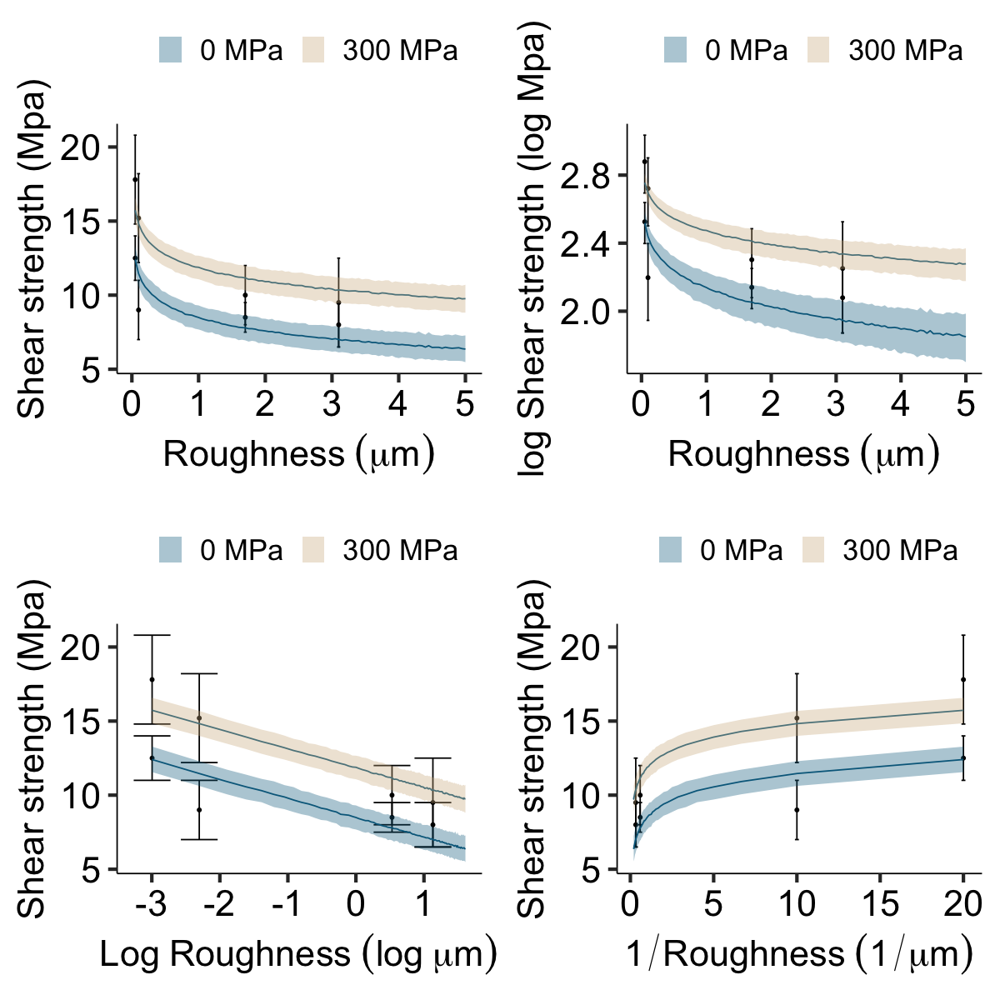

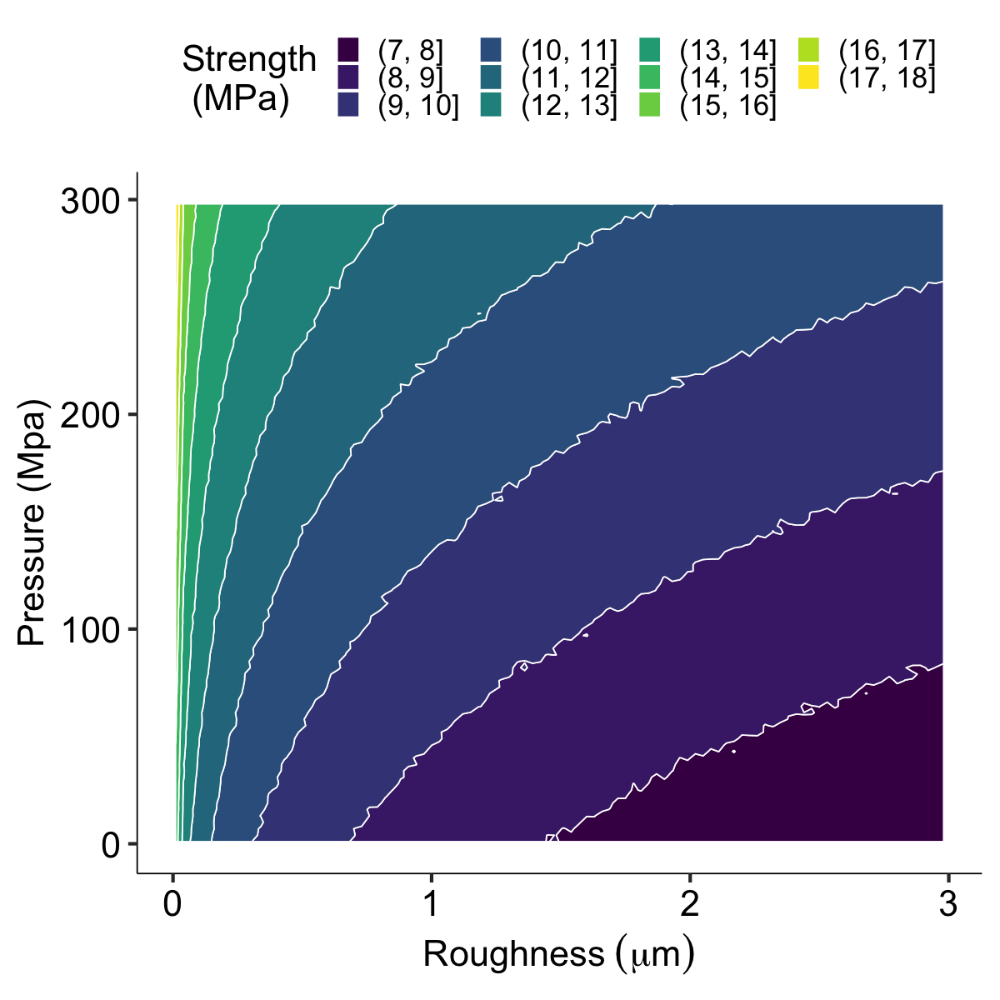

In [172]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * log(roughness)

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(0, 1), nlpar = "alpha1") +
#           prior(normal(0, 0.1), nlpar = "alpha1d") +
#           prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + alpha1 * log(roughness),
        alpha0 + alpha0d + alpha1 ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Log(Shear strength) vs roughness
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(1,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,12.32044,1.259476,10.193021,10.906607,11.509360,11.902577,12.92043,13.17836,13.73797,14.35915,0Pa
2,0.10,0,11.44625,1.245488,9.405233,10.020558,10.617279,11.057135,12.01455,12.28770,12.86311,13.48902,0Pa
3,0.15,0,10.93130,1.199491,8.976533,9.564603,10.103343,10.544483,11.48103,11.72481,12.30023,12.89005,0Pa
4,0.20,0,10.54178,1.186898,8.598556,9.162546,9.738879,10.178045,11.06588,11.33849,11.89648,12.53397,0Pa
5,0.25,0,10.24840,1.214037,8.244971,8.816618,9.408586,9.856497,10.79198,11.05904,11.66121,12.29491,0Pa
6,0.30,0,10.03892,1.169567,8.159556,8.675889,9.223481,9.658910,10.57228,10.80717,11.37468,11.95114,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,9.675702,1.327017,7.528513,8.151813,8.829193,9.259641,10.27121,10.54401,11.19570,11.87426,300Pa
196,4.80,300,9.675442,1.331043,7.528436,8.118837,8.835399,9.269345,10.29865,10.58074,11.19392,11.78852,300Pa
197,4.85,300,9.673104,1.328902,7.469422,8.190183,8.780035,9.234308,10.28761,10.57256,11.15783,11.82419,300Pa
198,4.90,300,9.648404,1.317678,7.499719,8.114628,8.777436,9.202247,10.23462,10.52381,11.19014,11.76670,300Pa
199,4.95,300,9.663445,1.302903,7.504359,8.148776,8.768279,9.268449,10.27306,10.55361,11.13344,11.80193,300Pa
200,5.00,300,9.626868,1.287846,7.509962,8.147812,8.772876,9.236965,10.21967,10.52395,11.06505,11.79157,300Pa


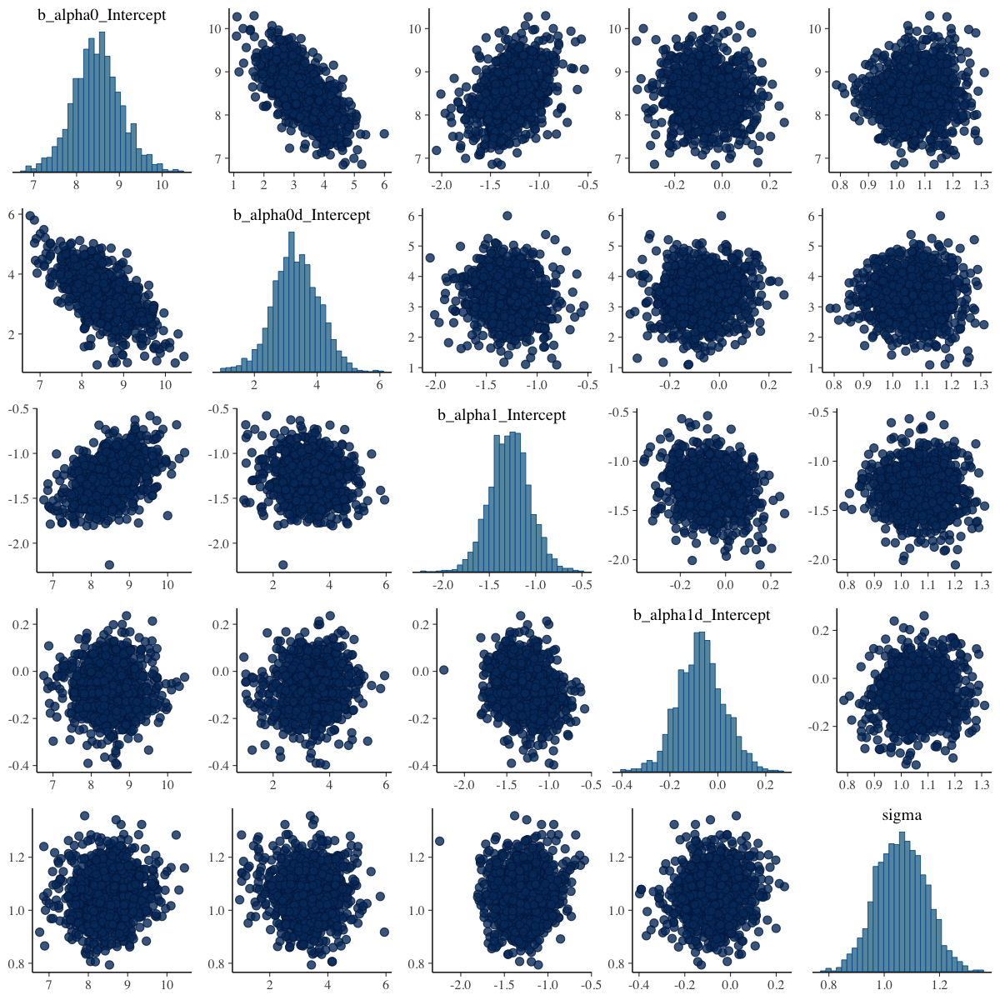

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,14.38465,1.419123,12.09069,13.45101,15.33363,16.66312
2,0.01,4,14.46862,1.409454,12.16406,13.51689,15.37548,16.80288
3,0.01,7,14.41489,1.386864,12.17224,13.47109,15.30216,16.72979
4,0.01,10,14.47613,1.377195,12.22328,13.58732,15.40375,16.73885
5,0.01,13,14.56007,1.384880,12.25375,13.62921,15.48123,16.88457
6,0.01,16,14.62412,1.410494,12.32759,13.67361,15.55376,16.94703


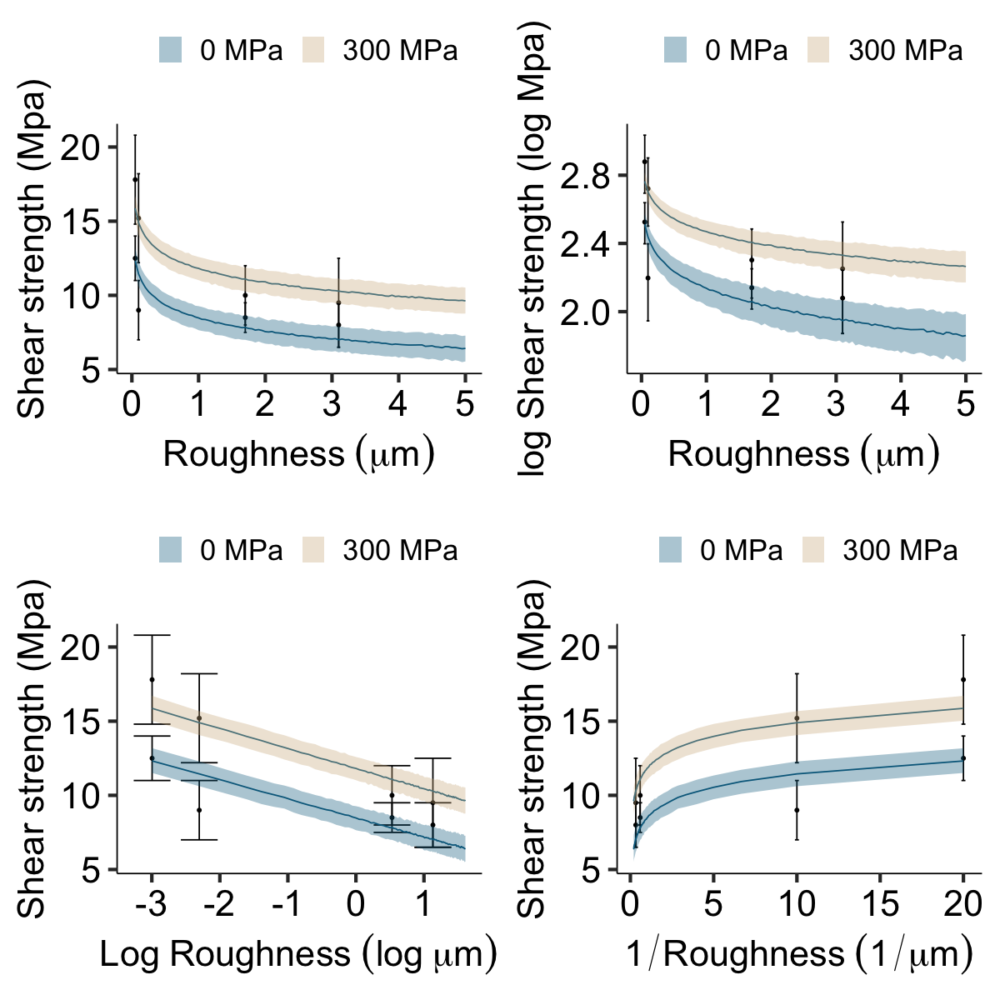

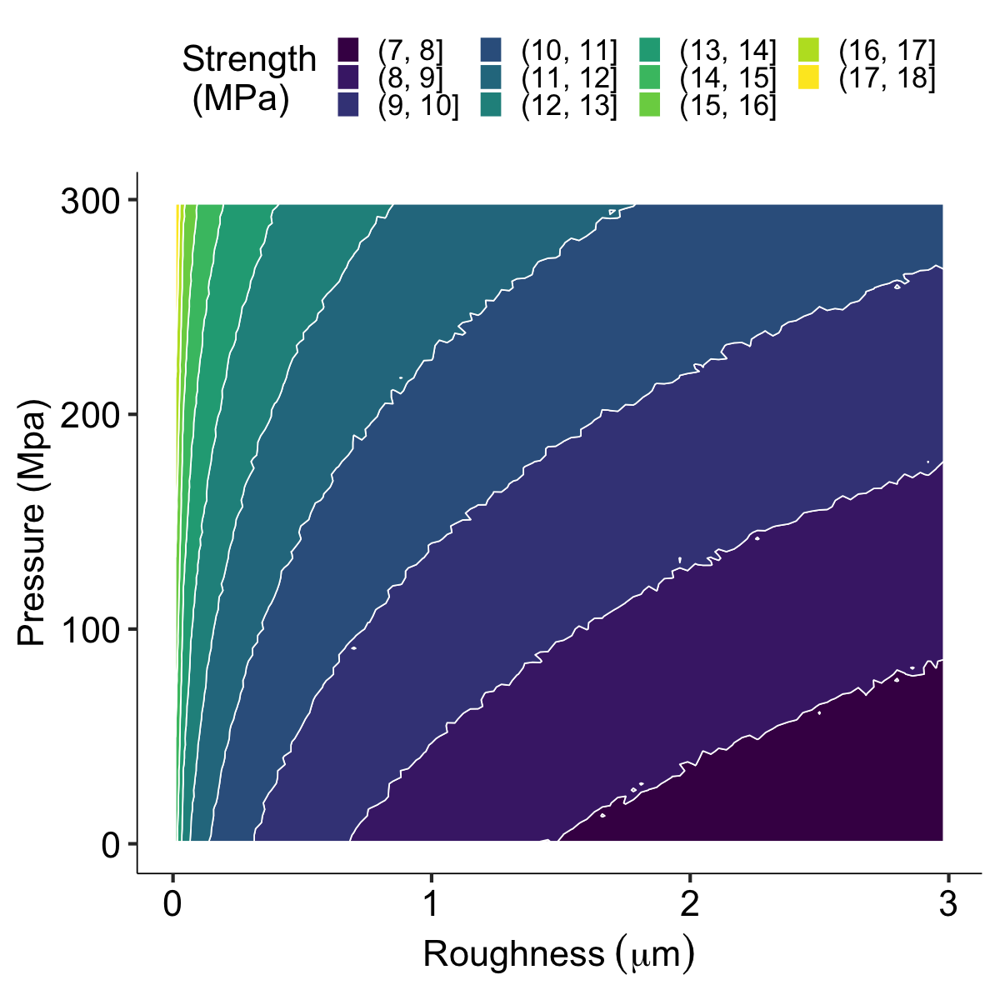

In [176]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + (alpha1 + alpha1d * pressure/300) * log(roughness)

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(0, 1), nlpar = "alpha1") +
          prior(normal(0, 0.1), nlpar = "alpha1d") +
#           prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + (alpha1 + alpha1d * pressure/300) * log(roughness),
        alpha0 + alpha0d + alpha1 + alpha1d~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Shear strength vs log(roughness)
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Shear strength vs 1/(roughness)
p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(1,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 

Compiling Stan program...

Start sampling



,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,0.05,0,11.090622,1.280043,8.970428,9.625595,10.281620,10.723141,11.64591,11.91491,12.51163,13.20029,0Pa
2,0.10,0,10.659474,1.164972,8.708299,9.318528,9.864736,10.288687,11.17107,11.44140,11.95872,12.52471,0Pa
3,0.15,0,10.296801,1.173283,8.421436,8.982133,9.518082,9.890933,10.80296,11.10520,11.67344,12.32788,0Pa
4,0.20,0,10.082781,1.141178,8.231711,8.781087,9.345363,9.743603,10.58605,10.82424,11.34021,11.96092,0Pa
5,0.25,0,9.939030,1.109552,8.210386,8.688723,9.168231,9.582724,10.44025,10.67007,11.20025,11.77426,0Pa
6,0.30,0,9.768533,1.145763,7.877213,8.465265,9.003414,9.424989,10.31549,10.55253,11.03826,11.59306,0Pa


,roughness,pressure,Estimate,Est.Error,Q5,Q12.5,Q25,Q37.5,Q67.5,Q75,Q87.5,Q95,key
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
195,4.75,300,8.245553,1.318543,6.087611,6.669048,7.349393,7.845626,8.819220,9.125508,9.724994,10.38014,300Pa
196,4.80,300,8.206547,1.337557,6.018494,6.634104,7.295643,7.779446,8.835100,9.123079,9.765114,10.41028,300Pa
197,4.85,300,8.180635,1.344479,5.907914,6.612975,7.294049,7.774984,8.784737,9.093934,9.717622,10.38452,300Pa
198,4.90,300,8.165743,1.346051,5.955871,6.561381,7.267696,7.737535,8.786769,9.053881,9.711299,10.36632,300Pa
199,4.95,300,8.104846,1.323955,5.880205,6.589609,7.213171,7.694948,8.711029,9.006429,9.660277,10.21264,300Pa
200,5.00,300,8.129496,1.283596,6.021461,6.640783,7.299016,7.753581,8.708457,8.980615,9.611817,10.22177,300Pa


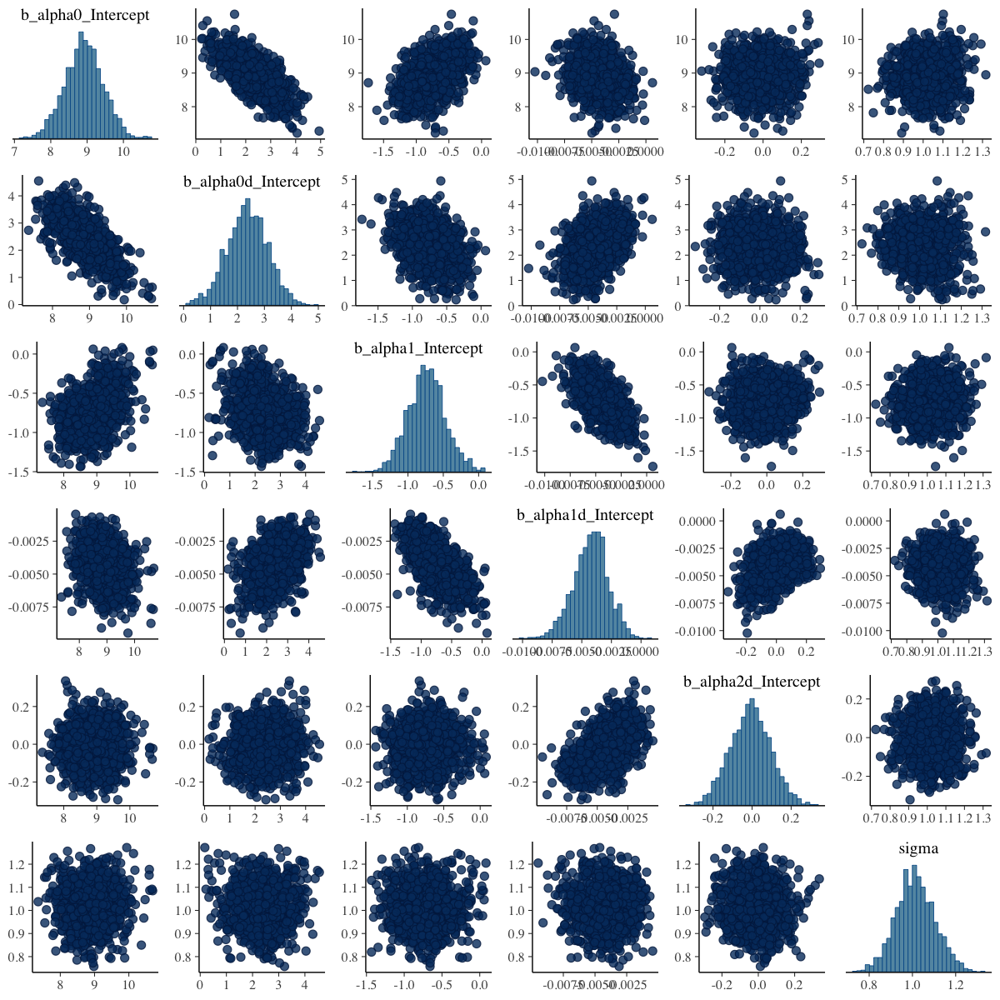

,roughness,pressure,Shear Strength MPa,Est.Error,Q5,Q25,Q75,Q95
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.01,1,12.30262,1.483268,9.923214,11.29608,13.26250,14.74171
2,0.01,4,12.37596,1.507274,9.809719,11.38173,13.35137,14.86098
3,0.01,7,12.47597,1.515290,9.989538,11.46706,13.49935,14.95513
4,0.01,10,12.59446,1.477107,10.121848,11.59703,13.59394,15.11227
5,0.01,13,12.65470,1.477539,10.206965,11.70213,13.62598,15.03140
6,0.01,16,12.74065,1.444847,10.404028,11.77261,13.69295,15.19335


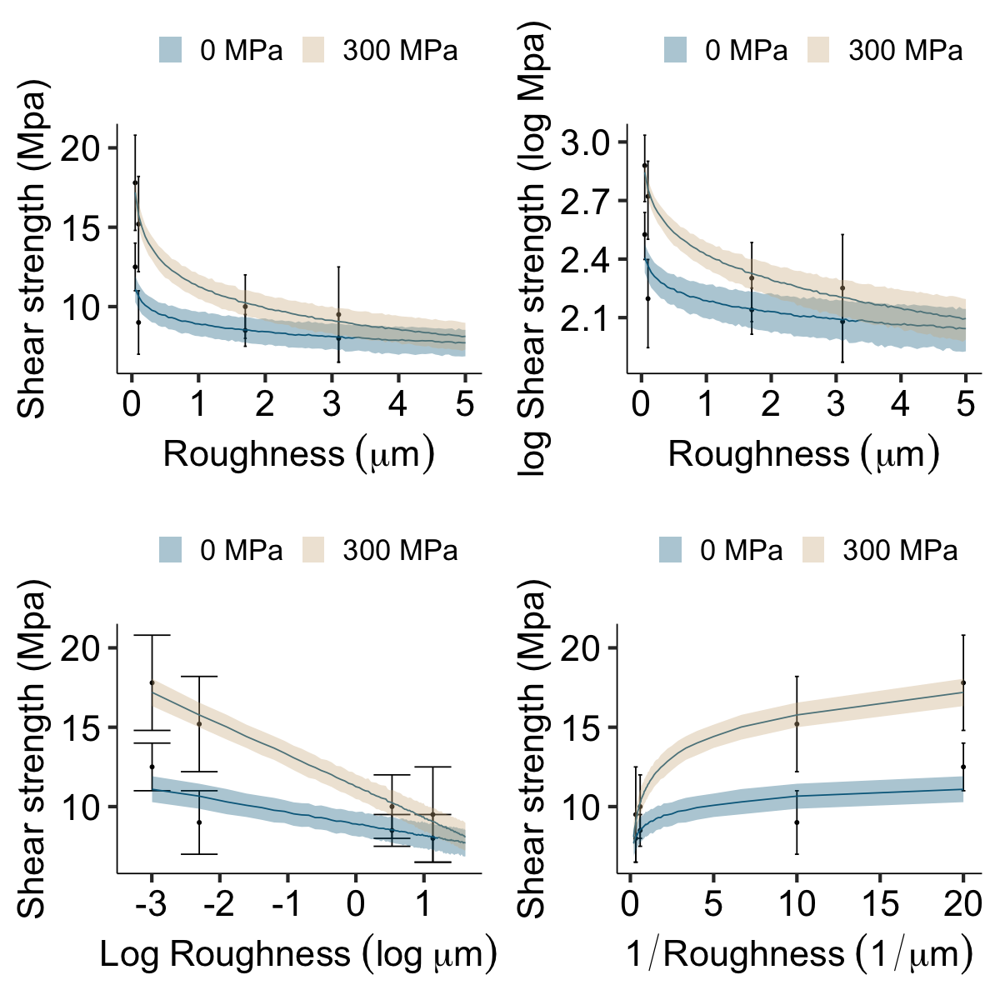

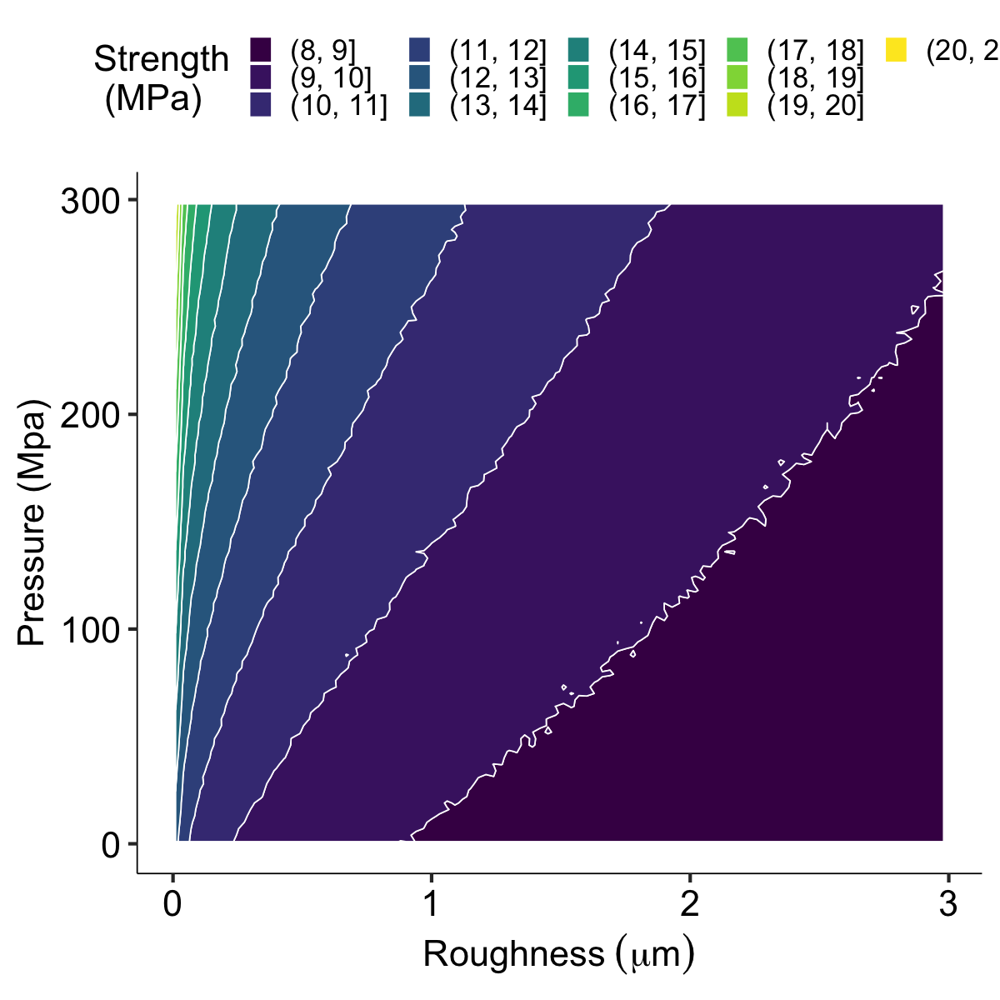

In [181]:
#shearStrength ~ alpha0 + (alpha0d * pressure/300) + (alpha1 + alpha1d * pressure/300) * log(pow(roughness,1 + alpha1d * pressure/300))

df = rbind(df2,df1)
prior1 <- 
        prior(normal(10, 3), nlpar = "alpha0",lb=0) +
           prior(normal(0, 3), nlpar = "alpha0d",lb=0) +
#           prior(normal(0, 0.1), nlpar = "alpha0dd") +
          prior(normal(0, 1), nlpar = "alpha1") +
          prior(normal(0, 0.1), nlpar = "alpha1d") +
#           prior(normal(1, 0.5), nlpar = "alpha2",lb=0) +
          prior(normal(0, 0.1), nlpar = "alpha2d") +
#           prior(normal(1, 1), nlpar = "alpha3",ub=0) +
#             prior(normal(0, 0.1), nlpar = "alpha2d") +
        prior(normal(1, 0.1), class = "sigma") 
fit <- brm(
        bf(shearStrength ~ alpha0 + (alpha0d * pressure/300) + (alpha1 + alpha1d * pressure) * log(pow(roughness,1 + alpha2d * pressure/300)),
        alpha0 + alpha0d + alpha1 + alpha1d +  alpha2d ~ 1, 
        nl = TRUE),
        data = df, 
        prior=prior1,
        iter=2000,
        chains = 2,
        cores = 2,
        seed = 8888,
        control = list(adapt_delta = 0.9),
        refresh = 0
)

pairs(fit)


pred_df1 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(0,length(seq(0.05,5,0.05))))
preds1 = cbind(pred_df1,predict(fit,newdata=pred_df1,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds1$key = "0Pa"

pred_df2 = data.frame(roughness=seq(0.05,5,0.05),pressure=rep(300,length(seq(0.05,5,0.05))))
preds2 = cbind(pred_df2,predict(fit,newdata=pred_df2,probs=c(0.05,0.125,0.25,0.375,0.675,0.75,0.875,0.95)))
preds2$key = "300Pa"

preds = rbind(preds1,preds2)

head(preds)
tail(preds)

# Shear strength vs roughness
p1 = ggplot(data=df) + geom_point(aes(x=roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Log(Shear strength) vs roughness
p2 = ggplot(data=df) + geom_point(aes(x=roughness,y=log(shearStrength),group=pressure),size=1)+
    geom_errorbar(aes(x=roughness, ymin=log(shearStrengthL), ymax=log(shearStrengthU)))+
    xlab(expression(Roughness ~ (mu*m)))+ ylab("log Shear strength (log Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=roughness, y=log(Estimate),group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = roughness, ymin = log(Q25), ymax = log(Q75), fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))

# Shear strength vs log(roughness)
p3 = ggplot(data=df) + geom_point(aes(x=log(roughness),y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=log(roughness), ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(Log~Roughness ~ (log~mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=log(roughness), y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = log(roughness), ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
# Shear strength vs 1/(roughness)
p4 = ggplot(data=df) + geom_point(aes(x=1/roughness,y=shearStrength,group=pressure),size=1)+
    geom_errorbar(aes(x=1/roughness, ymin=shearStrengthL, ymax=shearStrengthU))+
    xlab(expression(1/Roughness ~ (1/mu*m)))+ ylab("Shear strength (Mpa)")+
    theme_pubr(26) +
    geom_line(data = preds , aes(x=1/roughness, y=Estimate,group=pressure),col="Deepskyblue4") + 
     geom_ribbon(data = preds, aes(x = 1/roughness, ymin = Q25, ymax = Q75, fill = key)) +
     scale_fill_manual(name = "", labels = c("0 MPa","300 MPa"),values = c(alpha("Deepskyblue4",0.35),
                                                                     alpha("Tan",0.35)))
grid.arrange(p1, p2, p3, p4, nrow = 2)


basis = data.frame(roughness=seq(0.01,3,0.03),pressure=seq(1,300,3))
expanded_pred_df = basis %>% expand(roughness,pressure)
preds2 = cbind(expanded_pred_df,predict(fit,newdata=expanded_pred_df,probs=c(0.05,0.25,0.75,0.95)))
colnames(preds2)[3] <- "Shear Strength MPa"
head(preds2)

ggplot(data = preds2) +
    geom_contour_filled(aes(x=roughness, y=pressure, z=`Shear Strength MPa`),colour = "white") + 
    xlab(expression(Roughness ~ (mu*m)))+ ylab("Pressure (Mpa)")+
    guides(fill=guide_legend(title="Strength\n (MPa)"))+
#     scale_fill_(name=`Shear Strength MPa`) +
#     scale_fill_discrete(name = `Shear Strength MPa`)+
    theme_pubr(26) 